Importing the necessary package 

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from numpy.linalg import eig
import matplotlib.pyplot as plt
import seaborn as sn
import plotly.express as px
import plotly.graph_objects as go
import os
from factor_analyzer import Rotator
import seaborn as sns
import json
import geojson
from scipy.stats import weibull_min
import matplotlib.pyplot as plt
import plotly.express as px
import geopandas as gpd
import plotly.io as pio

Reading the data from the .csv file 

In [122]:
df = pd.read_csv('Variable in DAs.csv', encoding='latin-1', low_memory=False)
df

,CENSUS_YEAR,DGUID,ALT_GEO_CODE,GEO_LEVEL,GEO_NAME,CHARACTERISTIC_ID,CHARACTERISTIC_NAME,CHARACTERISTIC_NOTE,C1_COUNT_TOTAL,C2_COUNT_MEN+,C3_COUNT_WOMEN+,C10_RATE_TOTAL,C11_RATE_MEN+,C12_RATE_WOMEN+,Unnamed: 14
0,2021,2021S051259150307,59150307,Dissemination area,59150307,126,NaN,11.0,590.0,315.0,275.0,100.0,100.0,100.0,NaN
1,2021,2021S051259150307,59150307,Dissemination area,59150307,127,Number of total income recipients aged 15 ye...,NaN,555.0,295.0,265.0,94.1,93.7,96.4,NaN
2,2021,2021S051259150307,59150307,Dissemination area,59150307,128,Average total income in 2020 among recipie...,NaN,63400.0,77000.0,48400.0,63400.0,77000.0,48400.0,NaN
3,2021,2021S051259150307,59150307,Dissemination area,59150307,129,Number of after-tax income recipients aged 1...,NaN,555.0,295.0,265.0,94.1,93.7,96.4,NaN
4,2021,2021S051259150307,59150307,Dissemination area,59150307,130,Average after-tax income in 2020 among rec...,NaN,51600.0,60400.0,41600.0,51600.0,60400.0,41600.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471883,2021,2021S051259154196,59154196,Dissemination area,59154196,2619,Between 6 a.m. and 6:59 a.m.,NaN,50.0,20.0,25.0,13.5,9.8,14.7,NaN
471884,2021,2021S051259154196,59154196,Dissemination area,59154196,2620,Between 7 a.m. and 7:59 a.m.,NaN,110.0,70.0,40.0,29.7,34.1,23.5,NaN
471885,2021,2021S051259154196,59154196,Dissemination area,59154196,2621,Between 8 a.m. and 8:59 a.m.,NaN,50.0,15.0,30.0,13.5,7.3,17.6,NaN
471886,2021,2021S051259154196,59154196,Dissemination area,59154196,2622,Between 9 a.m. and 11:59 a.m.,NaN,85.0,40.0,45.0,23.0,19.5,26.5,NaN


Selecting only specific characteristics 

In [123]:
selected_variables = ['1539', '1540', '1462', '1463', '1464', '1999', '2001', '1993', 
                      '1416', '1453', '2620', '1827', '1757', '1771', '1705', '1713', 
                      '1684', '1403', '1082', '252', '1467', '151', '1488',
                      '128', '2226', '2224', '2225', '2227', '2248', '1441', '1442', 
                      '1443', '1444', '2607', '1976', '1433', '1451', '2223','1715']
selected_variables = list(map(int, selected_variables))
filtered_df = df[df['CHARACTERISTIC_ID'].isin(selected_variables)]
filtered_df

,CENSUS_YEAR,DGUID,ALT_GEO_CODE,GEO_LEVEL,GEO_NAME,CHARACTERISTIC_ID,CHARACTERISTIC_NAME,CHARACTERISTIC_NOTE,C1_COUNT_TOTAL,C2_COUNT_MEN+,C3_COUNT_WOMEN+,C10_RATE_TOTAL,C11_RATE_MEN+,C12_RATE_WOMEN+,Unnamed: 14
2,2021,2021S051259150307,59150307,Dissemination area,59150307,128,Average total income in 2020 among recipie...,NaN,63400.0,77000.0,48400.0,63400.0,77000.0,48400.0,NaN
25,2021,2021S051259150307,59150307,Dissemination area,59150307,151,Government transfers (%),20.0,12.7,9.2,19.2,12.7,9.2,19.2,NaN
55,2021,2021S051259150307,59150307,Dissemination area,59150307,252,Average total income of household in 2020 ($),NaN,133000.0,NaN,NaN,133000.0,NaN,NaN,NaN
82,2021,2021S051259150307,59150307,Dissemination area,59150307,1082,Non-official languages,NaN,250.0,120.0,135.0,35.0,32.9,39.1,NaN
104,2021,2021S051259150307,59150307,Dissemination area,59150307,1403,Indigenous identity,45.0,10.0,0.0,10.0,1.4,0.0,2.9,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471794,2021,2021S051259154196,59154196,Dissemination area,59154196,2226,Unemployed,NaN,55.0,20.0,30.0,NaN,NaN,NaN,NaN
471795,2021,2021S051259154196,59154196,Dissemination area,59154196,2227,Not in the labour force,NaN,225.0,95.0,135.0,NaN,NaN,NaN,NaN
471816,2021,2021S051259154196,59154196,Dissemination area,59154196,2248,All occupations,191.0,485.0,270.0,215.0,96.0,100.0,93.5,NaN
471873,2021,2021S051259154196,59154196,Dissemination area,59154196,2607,Public transit,NaN,120.0,45.0,75.0,32.4,22.0,44.1,NaN


In [124]:
filtered_df.to_csv('Selected-variables.csv')


As the last 'GEO' was repeated twice, we will drop the records that have been duplicated in the dataframe

In [125]:
filtered_df = filtered_df.drop_duplicates()

For our pre processing step we only need to consider the following characteristic ids:2223, 2224, 2225, 2226, 2227, 128, 252, 1488 
    

In [126]:
# Focusing on the data that is needed for the computation 
Considered_df = filtered_df[filtered_df['CHARACTERISTIC_ID'].isin([2223, 2224, 2225, 2226, 2227, 128, 252, 1488])]
Considered_df

,CENSUS_YEAR,DGUID,ALT_GEO_CODE,GEO_LEVEL,GEO_NAME,CHARACTERISTIC_ID,CHARACTERISTIC_NAME,CHARACTERISTIC_NOTE,C1_COUNT_TOTAL,C2_COUNT_MEN+,C3_COUNT_WOMEN+,C10_RATE_TOTAL,C11_RATE_MEN+,C12_RATE_WOMEN+,Unnamed: 14
2,2021,2021S051259150307,59150307,Dissemination area,59150307,128,Average total income in 2020 among recipie...,NaN,63400.0,77000.0,48400.0,63400.0,77000.0,48400.0,NaN
55,2021,2021S051259150307,59150307,Dissemination area,59150307,252,Average total income of household in 2020 ($),NaN,133000.0,NaN,NaN,133000.0,NaN,NaN,NaN
174,2021,2021S051259150307,59150307,Dissemination area,59150307,1488,Median value of dwellings ($),66.0,1700000.0,NaN,NaN,1700000.0,NaN,NaN,NaN
396,2021,2021S051259150307,59150307,Dissemination area,59150307,2223,Total - Population aged 15 years and over by l...,184.0,590.0,315.0,275.0,NaN,NaN,NaN,NaN
397,2021,2021S051259150307,59150307,Dissemination area,59150307,2224,In the labour force,NaN,405.0,220.0,185.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471374,2021,2021S051259154196,59154196,Dissemination area,59154196,2223,Total - Population aged 15 years and over by l...,184.0,730.0,370.0,360.0,NaN,NaN,NaN,NaN
471375,2021,2021S051259154196,59154196,Dissemination area,59154196,2224,In the labour force,NaN,505.0,275.0,225.0,NaN,NaN,NaN,NaN
471376,2021,2021S051259154196,59154196,Dissemination area,59154196,2225,Employed,NaN,450.0,255.0,200.0,NaN,NaN,NaN,NaN
471377,2021,2021S051259154196,59154196,Dissemination area,59154196,2226,Unemployed,NaN,55.0,20.0,30.0,NaN,NaN,NaN,NaN


# Computation for labor rates

We will compute the rates based on the subset of the data. At each time we would filter the data for each specific 'GEO_NAME' and then we would compute the rates based on the data for that 'GEO_NAME'. 

In this code we would start from an empty dataframe 'Filled_df' and at each time we would add the data computed for each 'GEO_NAME' to this dataframe at the end of each cycle. 

__NOTE:__ in our computation, we would also remove the characteristic that was not needed '2223' from the data of each 'GEO_NAME' and then add the data to our global dataframe. 

In [127]:
# The dataframe that would contain the filled values for the rates
Filled_df = pd.DataFrame()

# We will compute the rates for each 'GEO_NAME' one by one 
for geo in Considered_df['GEO_NAME'].unique(): 
    
    # Take the useful data for the computation of the rate of this 'GEO_NAME'
    One_sample = Considered_df[(Considered_df['GEO_NAME'] == geo) & 
                               Considered_df['CHARACTERISTIC_ID'].isin([2223, 2224, 2225, 2226, 2227])].copy()
    
    # Take the values of the total population 
    Denomenator = One_sample[One_sample['CHARACTERISTIC_ID'] == 2223][['C1_COUNT_TOTAL', 'C2_COUNT_MEN+', 'C3_COUNT_WOMEN+']]
    
    # Take the values of each type of the population 
    Numenator = One_sample[One_sample['CHARACTERISTIC_ID']!= 2223][['C1_COUNT_TOTAL', 'C2_COUNT_MEN+', 'C3_COUNT_WOMEN+']]
    
    # Computing the rates and put them in the corresponding cell
    One_sample[['C10_RATE_TOTAL', 'C11_RATE_MEN+', 'C12_RATE_WOMEN+']] = Numenator.divide(np.array(Denomenator)) * 100
    
    # Removing the chracteristic '2223' that is not needed for us which is the total population 
    One_sample = One_sample[One_sample['CHARACTERISTIC_ID'] != 2223]
    
    # Adding the new data for this 'GEO_NAME' to the temporary dataframe that we created
    Filled_df = pd.concat([Filled_df, One_sample])

# Scaling some characteristics 

We will scale the values for these characteristics (128, 252, 1488) and then concat the values to the previously filled data frame. 

In [128]:
# The characteristics that should be scaled
Need_to_scale = [128, 252, 1488]

# For each characteristic
for character_id in Need_to_scale: 
    
    # The data regarding this characteristic 
    temp_df = Considered_df[Considered_df['CHARACTERISTIC_ID'] == character_id].copy()
    
    # Taking the values of this characteristic
    data = np.array(temp_df['C1_COUNT_TOTAL'])
    
    # Creating a scaler
    scaler = MinMaxScaler((0, 100))
    
    # Getting the scaled data
    scaled_data = 100 - scaler.fit_transform(data.reshape(-1, 1))
    
    # Put the scaled value in the right column 
    temp_df['C10_RATE_TOTAL'] = scaled_data
    
    # Adding this subset of data to the datframe that we had before
    Filled_df = pd.concat([Filled_df, temp_df])

After the computations, we would merge the data that was considered and not considered for our computations, in order to get to the initial dataframe (filtered_df), and then sort the values based on the value of the 'GEO_NAME' and the 'CHARACTERISTIC_ID' and resetting the index of the data. 

In [129]:
# The data that has not been considered in the computation
Not_considered_df = filtered_df[~filtered_df['CHARACTERISTIC_ID'].isin([2223, 2224, 2225, 2226, 2227, 128, 252, 1488])].copy()

# Merging the considered and not considered data for the report 
# and sorting the data based on the 'GEO_NAME' and 'CHARACTERISTIC_ID'
Whole_df = pd.concat([Filled_df, Not_considered_df]).sort_values(['GEO_NAME','CHARACTERISTIC_ID']).reset_index(drop = True)

Taking a look at the final resulf of our data. 

In [130]:
Whole_df

,CENSUS_YEAR,DGUID,ALT_GEO_CODE,GEO_LEVEL,GEO_NAME,CHARACTERISTIC_ID,CHARACTERISTIC_NAME,CHARACTERISTIC_NOTE,C1_COUNT_TOTAL,C2_COUNT_MEN+,C3_COUNT_WOMEN+,C10_RATE_TOTAL,C11_RATE_MEN+,C12_RATE_WOMEN+,Unnamed: 14
0,2021,2021S051259150307,59150307,Dissemination area,59150307,128,Average total income in 2020 among recipie...,NaN,63400.0,77000.0,48400.0,92.436798,77000.000000,48400.000000,NaN
1,2021,2021S051259150307,59150307,Dissemination area,59150307,151,Government transfers (%),20.0,12.7,9.2,19.2,12.700000,9.200000,19.200000,NaN
2,2021,2021S051259150307,59150307,Dissemination area,59150307,252,Average total income of household in 2020 ($),NaN,133000.0,NaN,NaN,89.469437,NaN,NaN,NaN
3,2021,2021S051259150307,59150307,Dissemination area,59150307,1082,Non-official languages,NaN,250.0,120.0,135.0,35.000000,32.900000,39.100000,NaN
4,2021,2021S051259150307,59150307,Dissemination area,59150307,1403,Indigenous identity,45.0,10.0,0.0,10.0,1.400000,0.000000,2.900000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32576,2021,2021S051259154196,59154196,Dissemination area,59154196,2226,Unemployed,NaN,55.0,20.0,30.0,7.534247,5.405405,8.333333,NaN
32577,2021,2021S051259154196,59154196,Dissemination area,59154196,2227,Not in the labour force,NaN,225.0,95.0,135.0,30.821918,25.675676,37.500000,NaN
32578,2021,2021S051259154196,59154196,Dissemination area,59154196,2248,All occupations,191.0,485.0,270.0,215.0,96.000000,100.000000,93.500000,NaN
32579,2021,2021S051259154196,59154196,Dissemination area,59154196,2607,Public transit,NaN,120.0,45.0,75.0,32.400000,22.000000,44.100000,NaN


Taking a look at the final computation that was done for each 'GEO_NAME' to verify the computation of the rates. 

In [131]:
Whole_df[Whole_df['CHARACTERISTIC_ID'].isin([2223, 2224, 2225, 2226, 2227, 128, 252, 1488])]

,CENSUS_YEAR,DGUID,ALT_GEO_CODE,GEO_LEVEL,GEO_NAME,CHARACTERISTIC_ID,CHARACTERISTIC_NAME,CHARACTERISTIC_NOTE,C1_COUNT_TOTAL,C2_COUNT_MEN+,C3_COUNT_WOMEN+,C10_RATE_TOTAL,C11_RATE_MEN+,C12_RATE_WOMEN+,Unnamed: 14
0,2021,2021S051259150307,59150307,Dissemination area,59150307,128,Average total income in 2020 among recipie...,NaN,63400.0,77000.0,48400.0,92.436798,77000.000000,48400.000000,NaN
2,2021,2021S051259150307,59150307,Dissemination area,59150307,252,Average total income of household in 2020 ($),NaN,133000.0,NaN,NaN,89.469437,NaN,NaN,NaN
17,2021,2021S051259150307,59150307,Dissemination area,59150307,1488,Median value of dwellings ($),66.0,1700000.0,NaN,NaN,82.547170,NaN,NaN,NaN
27,2021,2021S051259150307,59150307,Dissemination area,59150307,2224,In the labour force,NaN,405.0,220.0,185.0,68.644068,69.841270,67.272727,NaN
28,2021,2021S051259150307,59150307,Dissemination area,59150307,2225,Employed,NaN,360.0,195.0,170.0,61.016949,61.904762,61.818182,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32564,2021,2021S051259154196,59154196,Dissemination area,59154196,1488,Median value of dwellings ($),66.0,2000000.0,NaN,NaN,78.616352,NaN,NaN,NaN
32574,2021,2021S051259154196,59154196,Dissemination area,59154196,2224,In the labour force,NaN,505.0,275.0,225.0,69.178082,74.324324,62.500000,NaN
32575,2021,2021S051259154196,59154196,Dissemination area,59154196,2225,Employed,NaN,450.0,255.0,200.0,61.643836,68.918919,55.555556,NaN
32576,2021,2021S051259154196,59154196,Dissemination area,59154196,2226,Unemployed,NaN,55.0,20.0,30.0,7.534247,5.405405,8.333333,NaN


## Final value 

Here we will only keep the necessary value that we want from each characteristic. We will add another column to put the final value that we want from each characteristic. 

For each characteristic except the followings we need the value of 'C10_RATE_TOTAL'

    Unemployed: 'C10_RATE_TOTAL'

    Employed: 'C12_RATE_WOMEN+'

    Not in the laybor force: 'C11_RATE_MEN'

    In the laybor force: 'C12_RATE_WOMEN+'

### Function final value 

We will write another function that based on the type of the characteristic, would take the correct final value of that characteristic. 

In [132]:
# This given one row, would output a specific value 
def final_value(x): 
    
    # If the characteristic id is 2225 or 2224 we need the rate for women 
    if x['CHARACTERISTIC_ID'] in [2225, 2224]: 
        return x['C12_RATE_WOMEN+']
    
    # If the characteristic id is 2227 we need the rate of the men
    elif x['CHARACTERISTIC_ID'] == 2227: 
        return x['C11_RATE_MEN+']

    # In all of other cases we need the value of the rate total 
    else: 
        return x['C10_RATE_TOTAL']
    
# Forming the final value 
Whole_df['Final value'] = Whole_df.apply(final_value, axis = 1)

Taking a look at the output for the final value and verify the final values. 

In [133]:
Whole_df[Whole_df['CHARACTERISTIC_ID'].isin([2223, 2224, 2225, 2226, 2227, 128, 252, 1488])]

,CENSUS_YEAR,DGUID,ALT_GEO_CODE,GEO_LEVEL,GEO_NAME,CHARACTERISTIC_ID,CHARACTERISTIC_NAME,CHARACTERISTIC_NOTE,C1_COUNT_TOTAL,C2_COUNT_MEN+,C3_COUNT_WOMEN+,C10_RATE_TOTAL,C11_RATE_MEN+,C12_RATE_WOMEN+,Unnamed: 14,Final value
0,2021,2021S051259150307,59150307,Dissemination area,59150307,128,Average total income in 2020 among recipie...,NaN,63400.0,77000.0,48400.0,92.436798,77000.000000,48400.000000,NaN,92.436798
2,2021,2021S051259150307,59150307,Dissemination area,59150307,252,Average total income of household in 2020 ($),NaN,133000.0,NaN,NaN,89.469437,NaN,NaN,NaN,89.469437
17,2021,2021S051259150307,59150307,Dissemination area,59150307,1488,Median value of dwellings ($),66.0,1700000.0,NaN,NaN,82.547170,NaN,NaN,NaN,82.547170
27,2021,2021S051259150307,59150307,Dissemination area,59150307,2224,In the labour force,NaN,405.0,220.0,185.0,68.644068,69.841270,67.272727,NaN,67.272727
28,2021,2021S051259150307,59150307,Dissemination area,59150307,2225,Employed,NaN,360.0,195.0,170.0,61.016949,61.904762,61.818182,NaN,61.818182
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32564,2021,2021S051259154196,59154196,Dissemination area,59154196,1488,Median value of dwellings ($),66.0,2000000.0,NaN,NaN,78.616352,NaN,NaN,NaN,78.616352
32574,2021,2021S051259154196,59154196,Dissemination area,59154196,2224,In the labour force,NaN,505.0,275.0,225.0,69.178082,74.324324,62.500000,NaN,62.500000
32575,2021,2021S051259154196,59154196,Dissemination area,59154196,2225,Employed,NaN,450.0,255.0,200.0,61.643836,68.918919,55.555556,NaN,55.555556
32576,2021,2021S051259154196,59154196,Dissemination area,59154196,2226,Unemployed,NaN,55.0,20.0,30.0,7.534247,5.405405,8.333333,NaN,7.534247


Here we will drop the meaningless column that we had. 



## Pivoting

Now we are ready to pivot the dataframe where in the columns we will find the different characteristics and in the rows we would have the 'DGUID'

In [134]:
pivot_df = Whole_df.pivot(index='GEO_NAME', columns='CHARACTERISTIC_NAME', values='Final value')
pivot_df_filled = pivot_df.fillna(0)
pivot_df_filled

CHARACTERISTIC_NAME,Average total income in 2020 among recipients ($),Employed,Unemployed,1960 or before,1961 to 1980,1981 to 1990,1991 to 2000,5 to 14 years,65 to 74 years,75 to 84 years,...,Not in the labour force,One-maintainer household,"Postsecondary certificate, diploma or degree",Public transit,Renter,"South Asian, n.o.s.",Spending 30% or more of income on shelter costs,Total visible minority population,Under 5 years,Average number of rooms per dwelling
GEO_NAME,,,,,,,,,,,,,,,,,,,,,
59150307,92.436798,61.818182,6.779661,38.9,16.7,3.7,18.5,23.7,11.1,11.1,...,30.158730,51.9,60.2,11.5,27.8,0.0,22.6,33.1,10.5,7.2
59150308,91.891325,68.085106,4.255319,68.2,6.8,4.5,6.8,21.9,18.2,4.5,...,30.434783,50.0,64.9,14.6,29.5,0.0,26.7,33.6,21.9,6.5
59150309,94.073219,70.000000,3.636364,38.5,9.6,5.8,5.8,9.5,13.5,3.8,...,28.813559,40.4,58.7,29.5,38.5,0.0,23.1,45.3,4.8,5.4
59150310,94.996329,74.626866,8.396947,20.3,29.1,3.8,5.1,17.9,3.8,0.0,...,14.062500,60.8,62.6,38.9,78.5,0.0,44.3,40.9,7.7,3.3
59150311,95.206126,52.631579,10.843373,36.1,11.1,11.1,16.7,19.4,22.2,8.3,...,35.555556,52.8,49.4,17.1,44.4,0.0,30.6,64.9,0.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59154192,86.016994,63.440860,4.444444,3.0,24.8,53.5,9.9,19.0,11.9,6.9,...,24.137931,56.4,87.2,6.3,9.9,0.0,24.0,23.2,9.5,4.7
59154193,90.548621,73.809524,4.678363,5.9,31.4,52.0,7.8,18.2,11.8,3.9,...,24.137931,48.0,82.5,14.5,56.9,0.0,23.5,24.9,10.9,3.7
59154194,95.415924,45.161290,7.142857,6.5,21.7,30.4,13.0,15.9,13.0,0.0,...,28.000000,43.5,49.1,26.9,56.5,3.7,26.1,64.2,7.2,5.2


## Final preprocessing 

In this section we would perform the final preprocessing steps in the data. Here we will update the rates for a specific characterstic and merge some characteristic to construct a new one. 

## Postsecondary rate update. 

The previous version of the values is: 

In [135]:
pivot_df['  Postsecondary certificate, diploma or degree']

GEO_NAME
59150307    60.2
59150308    64.9
59150309    58.7
59150310    62.6
59150311    49.4
            ... 
59154192    87.2
59154193    82.5
59154194    49.1
59154195    53.2
59154196    44.5
Name:   Postsecondary certificate, diploma or degree, Length: 1023, dtype: float64

In [136]:
# Updating the values 
pivot_df['  Postsecondary certificate, diploma or degree'] = 100 - pivot_df['  Postsecondary certificate, diploma or degree']
pivot_df['  Postsecondary certificate, diploma or degree']

GEO_NAME
59150307    39.8
59150308    35.1
59150309    41.3
59150310    37.4
59150311    50.6
            ... 
59154192    12.8
59154193    17.5
59154194    50.9
59154195    46.8
59154196    55.5
Name:   Postsecondary certificate, diploma or degree, Length: 1023, dtype: float64

## Columns aggregate: 2000 and before 

In [137]:
# Forming the new column
pivot_df_filled['2000 and before'] = pivot_df_filled[['  1960 or before', '  1961 to 1980', '  1981 to 1990', '  1991 to 2000']].sum(axis = 1)

# Removing the previous columns from the data 
pivot_df_filled.drop(['  1960 or before', '  1961 to 1980', '  1981 to 1990', '  1991 to 2000'], axis = 1, inplace = True)
pivot_df_filled

CHARACTERISTIC_NAME,Average total income in 2020 among recipients ($),Employed,Unemployed,5 to 14 years,65 to 74 years,75 to 84 years,85 years and over,African American,All occupations,Average total income of household in 2020 ($),...,One-maintainer household,"Postsecondary certificate, diploma or degree",Public transit,Renter,"South Asian, n.o.s.",Spending 30% or more of income on shelter costs,Total visible minority population,Under 5 years,Average number of rooms per dwelling,2000 and before
GEO_NAME,,,,,,,,,,,,,,,,,,,,,
59150307,92.436798,61.818182,6.779661,23.7,11.1,11.1,5.6,0.0,96.3,89.469437,...,51.9,60.2,11.5,27.8,0.0,22.6,33.1,10.5,7.2,77.8
59150308,91.891325,68.085106,4.255319,21.9,18.2,4.5,9.1,0.0,100.0,89.671172,...,50.0,64.9,14.6,29.5,0.0,26.7,33.6,21.9,6.5,86.3
59150309,94.073219,70.000000,3.636364,9.5,13.5,3.8,0.0,0.0,96.1,91.285051,...,40.4,58.7,29.5,38.5,0.0,23.1,45.3,4.8,5.4,59.7
59150310,94.996329,74.626866,8.396947,17.9,3.8,0.0,2.5,0.0,99.1,94.452290,...,60.8,62.6,38.9,78.5,0.0,44.3,40.9,7.7,3.3,58.3
59150311,95.206126,52.631579,10.843373,19.4,22.2,8.3,0.0,0.0,96.2,91.285051,...,52.8,49.4,17.1,44.4,0.0,30.6,64.9,0.0,6.0,75.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59154192,86.016994,63.440860,4.444444,19.0,11.9,6.9,3.0,0.0,100.0,86.645148,...,56.4,87.2,6.3,9.9,0.0,24.0,23.2,9.5,4.7,91.2
59154193,90.548621,73.809524,4.678363,18.2,11.8,3.9,0.0,0.0,99.2,90.861408,...,48.0,82.5,14.5,56.9,0.0,23.5,24.9,10.9,3.7,97.1
59154194,95.415924,45.161290,7.142857,15.9,13.0,0.0,8.7,0.0,98.6,91.184184,...,43.5,49.1,26.9,56.5,3.7,26.1,64.2,7.2,5.2,71.6


## Columns aggregate: 65 year and over

In [138]:
# Forming the new column
pivot_df_filled['65 years and over'] = pivot_df_filled[['  65 to 74 years', '  75 to 84 years', '  85 years and over']].sum(axis = 1)

# Removing the previous columns from the data 
pivot_df_filled.drop(['  65 to 74 years', '  75 to 84 years', '  85 years and over'], axis = 1, inplace = True)
pivot_df_filled


CHARACTERISTIC_NAME,Average total income in 2020 among recipients ($),Employed,Unemployed,5 to 14 years,African American,All occupations,Average total income of household in 2020 ($),Between 7 a.m. and 7:59 a.m.,"Black, n.o.s.","Caucasian (White), n.o.s.",...,"Postsecondary certificate, diploma or degree",Public transit,Renter,"South Asian, n.o.s.",Spending 30% or more of income on shelter costs,Total visible minority population,Under 5 years,Average number of rooms per dwelling,2000 and before,65 years and over
GEO_NAME,,,,,,,,,,,,,,,,,,,,,
59150307,92.436798,61.818182,6.779661,23.7,0.0,96.3,89.469437,23.1,0.0,0.0,...,60.2,11.5,27.8,0.0,22.6,33.1,10.5,7.2,77.8,27.8
59150308,91.891325,68.085106,4.255319,21.9,0.0,100.0,89.671172,17.1,0.0,0.0,...,64.9,14.6,29.5,0.0,26.7,33.6,21.9,6.5,86.3,31.8
59150309,94.073219,70.000000,3.636364,9.5,0.0,96.1,91.285051,18.2,0.0,1.6,...,58.7,29.5,38.5,0.0,23.1,45.3,4.8,5.4,59.7,17.3
59150310,94.996329,74.626866,8.396947,17.9,0.0,99.1,94.452290,23.6,0.0,2.0,...,62.6,38.9,78.5,0.0,44.3,40.9,7.7,3.3,58.3,6.3
59150311,95.206126,52.631579,10.843373,19.4,0.0,96.2,91.285051,20.0,0.0,0.0,...,49.4,17.1,44.4,0.0,30.6,64.9,0.0,6.0,75.0,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59154192,86.016994,63.440860,4.444444,19.0,0.0,100.0,86.645148,20.6,0.0,3.8,...,87.2,6.3,9.9,0.0,24.0,23.2,9.5,4.7,91.2,21.8
59154193,90.548621,73.809524,4.678363,18.2,0.0,99.2,90.861408,23.2,0.0,0.0,...,82.5,14.5,56.9,0.0,23.5,24.9,10.9,3.7,97.1,15.7
59154194,95.415924,45.161290,7.142857,15.9,0.0,98.6,91.184184,21.2,0.0,0.0,...,49.1,26.9,56.5,3.7,26.1,64.2,7.2,5.2,71.6,21.7


Then we can look at the final versoin of the data: 

In [139]:
pivot_df_filled.to_csv('pivot_df-test.csv')

# Correlation matrix

In [140]:
corr_matrix = pivot_df_filled.corr().round(2)
corr_matrix

CHARACTERISTIC_NAME,Average total income in 2020 among recipients ($),Employed,Unemployed,5 to 14 years,African American,All occupations,Average total income of household in 2020 ($),Between 7 a.m. and 7:59 a.m.,"Black, n.o.s.","Caucasian (White), n.o.s.",...,"Postsecondary certificate, diploma or degree",Public transit,Renter,"South Asian, n.o.s.",Spending 30% or more of income on shelter costs,Total visible minority population,Under 5 years,Average number of rooms per dwelling,2000 and before,65 years and over
CHARACTERISTIC_NAME,,,,,,,,,,,,,,,,,,,,,
Average total income in 2020 among recipients ($),1.00,0.06,0.11,-0.01,0.02,0.16,0.98,0.09,0.02,0.01,...,-0.13,0.29,0.04,0.04,0.26,0.20,0.00,-0.05,0.00,-0.06
Employed,0.06,1.00,0.01,0.05,0.03,0.30,0.15,0.21,0.07,0.26,...,0.47,0.10,0.37,0.02,0.08,-0.42,0.06,-0.45,0.02,-0.66
Unemployed,0.11,0.01,1.00,-0.04,0.03,-0.18,0.14,0.06,0.04,0.08,...,-0.10,0.22,0.27,0.02,0.06,-0.01,-0.02,-0.23,0.07,-0.17
5 to 14 years,-0.01,0.05,-0.04,1.00,0.04,0.02,-0.01,0.04,0.02,0.02,...,0.18,-0.16,-0.15,-0.01,0.12,-0.05,0.12,0.13,-0.12,-0.11
African American,0.02,0.03,0.03,0.04,1.00,0.00,0.03,-0.02,-0.01,0.02,...,0.03,0.04,0.05,0.08,0.01,-0.08,0.03,-0.06,0.04,-0.02
All occupations,0.16,0.30,-0.18,0.02,0.00,1.00,0.17,0.08,-0.01,0.06,...,0.23,0.04,-0.03,0.01,0.05,-0.15,0.02,0.00,-0.01,-0.22
Average total income of household in 2020 ($),0.98,0.15,0.14,-0.01,0.03,0.17,1.00,0.13,0.04,0.09,...,-0.01,0.27,0.18,0.03,0.31,0.06,0.01,-0.23,0.02,-0.12
Between 7 a.m. and 7:59 a.m.,0.09,0.21,0.06,0.04,-0.02,0.08,0.13,1.00,0.01,0.14,...,0.16,-0.00,0.11,-0.01,-0.02,-0.22,0.05,-0.18,0.07,-0.07
"Black, n.o.s.",0.02,0.07,0.04,0.02,-0.01,-0.01,0.04,0.01,1.00,0.02,...,0.03,-0.03,0.07,0.03,0.04,-0.06,0.03,-0.10,-0.03,-0.05


Plotting the Correlation matrix as Heatmap

<Axes: xlabel='CHARACTERISTIC_NAME', ylabel='CHARACTERISTIC_NAME'>

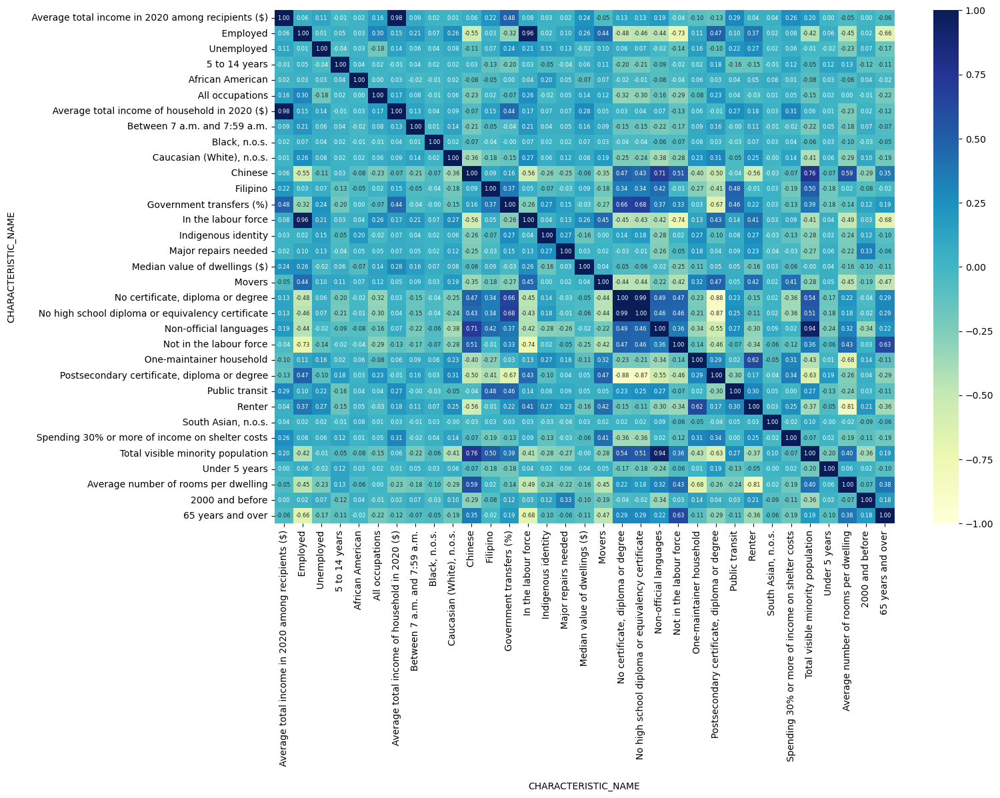

In [141]:
fig = plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', annot_kws={"fontsize": 6}, cmap='YlGnBu', vmin=-1, vmax=1)

# Selecting the correlation value higher than 0.9

In [142]:
def find_high_correlation(corr_matrix, threshold, variable_names):
    features = []
    Nvar = corr_matrix.shape[0]
    
    for i in range(Nvar):
        for j in range(i + 1, Nvar):
            if abs(corr_matrix[i, j]) > threshold:
                var1 = variable_names[i]
                var2 = variable_names[j]
                features.append((var1, var2, corr_matrix[i, j]))
    
    return features


variable_names = pivot_df_filled.columns.tolist()

corr_features = find_high_correlation(corr_matrix.values, 0.9, variable_names)
corr_features

[('    Average total income in 2020 among recipients ($)',
  '  Average total income of household in 2020 ($)',
  0.98),
 ('    Employed', '  In the labour force', 0.96),
 ('  No certificate, diploma or degree',
  '  No high school diploma or equivalency certificate',
  0.99),
 ('  Non-official languages', '  Total visible minority population', 0.94)]

# Dropping some variables after correlation matrix

In [143]:
import pandas as pd

variables_to_drop = ['  Average total income in 2020 among recipients ($)', '  In the labour force',
                     '  No high school diploma or equivalency certificate', '  Non-official languages']

# Removing spaces and convert to lowercase
variables_to_drop = [column.strip().lower() for column in variables_to_drop]
pivot_df_filled.columns = pivot_df_filled.columns.str.strip().str.lower()
pivot_df_filled_dropped = pivot_df_filled.drop(variables_to_drop, axis=1)
#pivot_df_filled_dropped = pivot_df_filled_dropped.reset_index(drop=True)


pivot_df_filled_dropped.round(2)


CHARACTERISTIC_NAME,employed,unemployed,5 to 14 years,african american,all occupations,average total income of household in 2020 ($),between 7 a.m. and 7:59 a.m.,"black, n.o.s.","caucasian (white), n.o.s.",chinese,...,"postsecondary certificate, diploma or degree",public transit,renter,"south asian, n.o.s.",spending 30% or more of income on shelter costs,total visible minority population,under 5 years,average number of rooms per dwelling,2000 and before,65 years and over
GEO_NAME,,,,,,,,,,,,,,,,,,,,,
59150307,61.82,6.78,23.7,0.0,96.3,89.47,23.1,0.0,0.0,12.7,...,60.2,11.5,27.8,0.0,22.6,33.1,10.5,7.2,77.8,27.8
59150308,68.09,4.26,21.9,0.0,100.0,89.67,17.1,0.0,0.0,21.8,...,64.9,14.6,29.5,0.0,26.7,33.6,21.9,6.5,86.3,31.8
59150309,70.00,3.64,9.5,0.0,96.1,91.29,18.2,0.0,1.6,21.9,...,58.7,29.5,38.5,0.0,23.1,45.3,4.8,5.4,59.7,17.3
59150310,74.63,8.40,17.9,0.0,99.1,94.45,23.6,0.0,2.0,15.3,...,62.6,38.9,78.5,0.0,44.3,40.9,7.7,3.3,58.3,6.3
59150311,52.63,10.84,19.4,0.0,96.2,91.29,20.0,0.0,0.0,40.4,...,49.4,17.1,44.4,0.0,30.6,64.9,0.0,6.0,75.0,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59154192,63.44,4.44,19.0,0.0,100.0,86.65,20.6,0.0,3.8,9.0,...,87.2,6.3,9.9,0.0,24.0,23.2,9.5,4.7,91.2,21.8
59154193,73.81,4.68,18.2,0.0,99.2,90.86,23.2,0.0,0.0,9.2,...,82.5,14.5,56.9,0.0,23.5,24.9,10.9,3.7,97.1,15.7
59154194,45.16,7.14,15.9,0.0,98.6,91.18,21.2,0.0,0.0,22.4,...,49.1,26.9,56.5,3.7,26.1,64.2,7.2,5.2,71.6,21.7


In [144]:
pivot_df_filled_dropped.to_csv('Selected_variables.csv')
df1 = pd.read_csv('Selected_variables.csv')

# Describe variables

In [145]:
df1.describe().round(2)

,GEO_NAME,employed,unemployed,5 to 14 years,african american,all occupations,average total income of household in 2020 ($),between 7 a.m. and 7:59 a.m.,"black, n.o.s.","caucasian (white), n.o.s.",...,"postsecondary certificate, diploma or degree",public transit,renter,"south asian, n.o.s.",spending 30% or more of income on shelter costs,total visible minority population,under 5 years,average number of rooms per dwelling,2000 and before,65 years and over
count,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,...,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00
mean,59151680.52,57.72,6.04,14.65,0.02,97.75,89.18,21.56,0.01,1.25,...,64.82,21.95,49.88,0.12,31.18,54.14,7.06,5.05,74.90,24.08
std,1339.87,12.24,2.79,6.19,0.16,3.76,12.43,7.51,0.11,1.98,...,13.15,10.55,21.57,0.77,10.52,23.87,5.06,1.57,19.63,11.83
min,59150307.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,...,0.00,0.00,5.40,0.00,0.00,0.00,0.00,1.40,0.00,0.00
25%,59150595.50,49.63,4.18,10.70,0.00,96.70,89.17,16.80,0.00,0.00,...,54.75,14.55,34.00,0.00,24.30,33.85,3.80,3.60,65.40,15.65
50%,59150927.00,57.89,5.83,14.50,0.00,98.20,91.75,21.40,0.00,0.00,...,67.10,21.10,46.10,0.00,30.80,52.50,6.80,5.10,77.50,22.80
75%,59153203.50,66.67,7.69,18.35,0.00,100.00,93.61,26.20,0.00,2.30,...,75.30,28.60,64.85,0.00,37.75,76.50,9.85,6.00,89.50,30.85
max,59154196.00,87.84,17.31,38.50,2.50,100.00,100.00,50.00,1.90,10.50,...,89.60,65.30,100.00,11.50,64.50,100.00,30.00,10.40,104.30,94.40


# Standard Scaling

In [146]:
df1 = pd.read_csv('Selected_variables.csv', dtype={'GEO_NAME': str})
columns_to_scale = df1.columns[1:]  

def standardScaler(data):
    '''axis=0 means along the column, axis=1 means working along the row.'''
    scaled_data = (data[columns_to_scale] - np.mean(data[columns_to_scale], axis=0)) / np.std(data[columns_to_scale], axis=0)
    
    # Combine the first column (GEO_NAME) with the scaled data
    scaled_df = pd.concat([data['GEO_NAME'], scaled_data], axis=1)
    
    return scaled_df

# Apply the scaling function to the selected columns
scaled_df = standardScaler(df1)
scaled_df = np.around(scaled_df, 2)
display(scaled_df)

# Calculate column means for the selected columns
column_means = np.mean(scaled_df[columns_to_scale], axis=0)
column_means[np.abs(column_means) < 1e-2] = 0
display(column_means)



,GEO_NAME,employed,unemployed,5 to 14 years,african american,all occupations,average total income of household in 2020 ($),between 7 a.m. and 7:59 a.m.,"black, n.o.s.","caucasian (white), n.o.s.",...,"postsecondary certificate, diploma or degree",public transit,renter,"south asian, n.o.s.",spending 30% or more of income on shelter costs,total visible minority population,under 5 years,average number of rooms per dwelling,2000 and before,65 years and over
0,59150307,0.33,0.27,1.46,-0.1,-0.38,0.02,0.20,-0.09,-0.63,...,-0.35,-0.99,-1.02,-0.15,-0.82,-0.88,0.68,1.37,0.15,0.31
1,59150308,0.85,-0.64,1.17,-0.1,0.60,0.04,-0.59,-0.09,-0.63,...,0.01,-0.70,-0.95,-0.15,-0.43,-0.86,2.93,0.92,0.58,0.65
2,59150309,1.00,-0.86,-0.83,-0.1,-0.44,0.17,-0.45,-0.09,0.18,...,-0.47,0.72,-0.53,-0.15,-0.77,-0.37,-0.45,0.22,-0.77,-0.57
3,59150310,1.38,0.85,0.52,-0.1,0.36,0.42,0.27,-0.09,0.38,...,-0.17,1.61,1.33,-0.15,1.25,-0.55,0.13,-1.11,-0.85,-1.50
4,59150311,-0.42,1.72,0.77,-0.1,-0.41,0.17,-0.21,-0.09,-0.63,...,-1.17,-0.46,-0.25,-0.15,-0.06,0.45,-1.40,0.61,0.01,0.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,59154192,0.47,-0.57,0.70,-0.1,0.60,-0.20,-0.13,-0.09,1.29,...,1.70,-1.48,-1.85,-0.15,-0.68,-1.30,0.48,-0.22,0.83,-0.19
1019,59154193,1.31,-0.49,0.57,-0.1,0.39,0.14,0.22,-0.09,-0.63,...,1.35,-0.71,0.33,-0.15,-0.73,-1.23,0.76,-0.86,1.13,-0.71
1020,59154194,-1.03,0.40,0.20,-0.1,0.23,0.16,-0.05,-0.09,-0.63,...,-1.20,0.47,0.31,4.68,-0.48,0.42,0.03,0.10,-0.17,-0.20
1021,59154195,-1.20,0.66,-0.20,-0.1,-0.12,0.23,1.18,-0.09,-0.63,...,-0.88,-0.64,-0.48,-0.15,-0.99,1.55,-0.92,0.48,-0.10,0.44


employed                                           0.0
unemployed                                         0.0
5 to 14 years                                      0.0
african american                                   0.0
all occupations                                    0.0
average total income of household in 2020 ($)      0.0
between 7 a.m. and 7:59 a.m.                       0.0
black, n.o.s.                                      0.0
caucasian (white), n.o.s.                          0.0
chinese                                            0.0
filipino                                           0.0
government transfers (%)                           0.0
indigenous identity                                0.0
major repairs needed                               0.0
median value of dwellings ($)                      0.0
movers                                             0.0
no certificate, diploma or degree                  0.0
not in the labour force                            0.0
one-mainta

In [147]:
scaled_df.to_csv('scaled_df.csv')

# Covariance Matrix

In [148]:
def computeCovarianceMatrix(data):
    len_data = data.shape[0]

    data_subset = data.iloc[:, 1:]
    
    covariance = data_subset.T.dot(data_subset) / len_data
    return covariance

# Compute the covariance matrix for all columns except the first one
cov_mat = computeCovarianceMatrix(scaled_df)
cov_mat = np.around(cov_mat, 2)
cov_mat


,employed,unemployed,5 to 14 years,african american,all occupations,average total income of household in 2020 ($),between 7 a.m. and 7:59 a.m.,"black, n.o.s.","caucasian (white), n.o.s.",chinese,...,"postsecondary certificate, diploma or degree",public transit,renter,"south asian, n.o.s.",spending 30% or more of income on shelter costs,total visible minority population,under 5 years,average number of rooms per dwelling,2000 and before,65 years and over
employed,1.00,0.01,0.05,0.03,0.30,0.15,0.21,0.07,0.26,-0.55,...,0.47,0.10,0.37,0.02,0.08,-0.42,0.06,-0.45,0.02,-0.66
unemployed,0.01,1.00,-0.04,0.03,-0.18,0.14,0.06,0.04,0.08,-0.11,...,-0.10,0.22,0.27,0.02,0.06,-0.01,-0.02,-0.24,0.07,-0.17
5 to 14 years,0.05,-0.04,1.00,0.04,0.02,-0.01,0.04,0.02,0.02,0.03,...,0.18,-0.16,-0.15,-0.01,0.12,-0.05,0.12,0.13,-0.12,-0.11
african american,0.03,0.03,0.04,1.00,0.00,0.03,-0.02,-0.01,0.02,-0.08,...,0.03,0.04,0.05,0.08,0.01,-0.08,0.03,-0.06,0.04,-0.02
all occupations,0.30,-0.18,0.02,0.00,1.00,0.17,0.08,-0.01,0.06,-0.23,...,0.23,0.04,-0.03,0.01,0.05,-0.15,0.02,0.00,-0.01,-0.22
average total income of household in 2020 ($),0.15,0.14,-0.01,0.03,0.17,1.00,0.13,0.04,0.09,-0.07,...,-0.01,0.27,0.18,0.03,0.31,0.06,0.01,-0.23,0.03,-0.12
between 7 a.m. and 7:59 a.m.,0.21,0.06,0.04,-0.02,0.08,0.13,1.00,0.01,0.14,-0.21,...,0.16,-0.00,0.11,-0.01,-0.02,-0.22,0.05,-0.18,0.07,-0.07
"black, n.o.s.",0.07,0.04,0.02,-0.01,-0.01,0.04,0.01,1.00,0.02,-0.07,...,0.03,-0.03,0.07,0.03,0.04,-0.06,0.03,-0.10,-0.03,-0.05
"caucasian (white), n.o.s.",0.26,0.08,0.02,0.02,0.06,0.09,0.14,0.02,1.00,-0.36,...,0.31,-0.05,0.25,-0.00,0.14,-0.41,0.06,-0.29,0.10,-0.19
chinese,-0.55,-0.11,0.03,-0.08,-0.23,-0.07,-0.21,-0.07,-0.36,1.00,...,-0.50,-0.04,-0.56,-0.03,-0.07,0.76,-0.07,0.59,-0.29,0.35


# Plotting the Covariance Matrix as Heatmap

<Axes: >

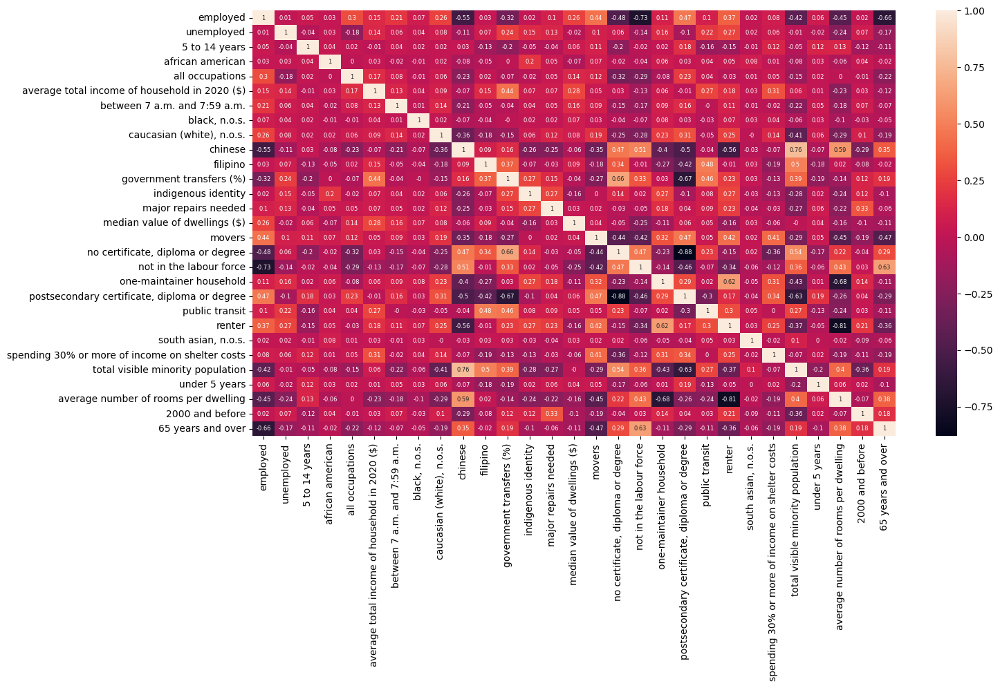

In [149]:
fig = plt.figure(figsize=(15, 8))
'''Annotate each cell with the numeric value using integer formatting'''
sn.heatmap(cov_mat.round(2), annot=True, fmt='g', annot_kws={"fontsize": 6})

# Eigen Decomposition of Covariance Matrix

In [150]:
eig_values, eig_vectors = np.linalg.eig(cov_mat)
if np.any(np.isclose(eig_values, 0)):
    print("Zero eigenvalues found. Handle the condition accordingly.")

print('\nNumber of Eigenvectors : %s ' % len(eig_vectors))
print('\nEigenvectors : \n\n%s' % eig_vectors)
print('\nEigenvalues : \n\n%s' % eig_values)


# Visualize above eigenvectors as a dataframe (or coefficient matrix)
eigenvec_df = pd.DataFrame(eig_vectors)
eigenvec_df.columns = ['eigvec_'+str(i+1) for i in range(0, len(eig_vectors))]
display(eigenvec_df.T)


Number of Eigenvectors : 29 

Eigenvectors : 

[[-2.93926359e-01 -1.36442660e-02  2.64771257e-01 -1.94212818e-01
   1.51702645e-01  6.02827720e-04 -1.44084296e-02 -6.06513841e-02
  -3.83687670e-02  6.81875407e-02  2.51696099e-01 -7.44095842e-01
  -1.39250215e-01  1.47082684e-01 -2.27930168e-02 -1.12617602e-01
   7.22759303e-02 -4.67441162e-02  5.24157527e-02 -2.32381759e-03
  -2.86358489e-01 -5.16813904e-02  2.83079894e-02  3.88165212e-02
  -3.56906170e-02 -3.73208795e-02  3.36750073e-02  1.52181125e-02
   1.21200079e-02]
 [-4.89210997e-02 -2.37742711e-01 -1.04385943e-02  1.24847208e-01
   1.88971811e-02  1.68592186e-01 -2.62597077e-01 -4.95305428e-02
  -3.65880816e-02  1.86191406e-02 -4.93893221e-02 -1.65080564e-01
  -1.53500349e-02  8.27433998e-02  8.70295816e-03  1.45525644e-02
  -7.01459962e-02  6.60049114e-02  3.34412125e-01 -3.92427310e-02
   3.75314956e-01  1.96793444e-01 -3.24975204e-01  2.19825877e-01
   3.33052372e-01  3.87835174e-01  2.61068069e-01  2.70813195e-02
   7.2633

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
eigvec_1,-0.293926,-0.048921,-0.040074,-0.034896,-0.109134,-0.051718,-0.107388,-0.040881,-0.190429,0.316841,...,-0.308668,0.022422,-0.242954,0.001977,-0.141495,0.306263,-0.064772,0.272908,-0.051755,0.235880
eigvec_2,-0.013644,-0.237743,0.174580,-0.042327,0.063780,-0.226863,-0.025253,-0.021424,-0.012852,0.102935,...,0.258597,-0.354753,-0.330487,-0.028571,0.026836,-0.071467,0.126261,0.295749,-0.109968,0.055469
eigvec_3,0.264771,-0.010439,0.047892,-0.077203,0.210825,0.205383,0.022240,0.010349,-0.070711,0.096781,...,-0.028652,0.221553,-0.096343,0.110429,0.065057,0.296886,-0.059647,0.017918,-0.323987,-0.295006
eigvec_4,-0.194213,0.124847,0.119672,0.012000,-0.266802,0.013967,-0.194507,0.037894,-0.057994,0.207735,...,0.036104,-0.004346,0.170397,0.033841,0.481594,0.192588,-0.076694,-0.116588,-0.331777,-0.036302
eigvec_5,0.151703,0.018897,-0.183806,0.114858,-0.133771,-0.574160,-0.243645,-0.081263,-0.120663,-0.091228,...,-0.077191,0.038596,0.111858,0.131511,-0.343893,0.016999,-0.151508,-0.028653,-0.126103,-0.233491
eigvec_6,0.000603,0.168592,0.393868,0.484266,-0.041765,0.087860,-0.001220,0.143742,-0.041025,0.057488,...,-0.085262,-0.067690,-0.124677,0.259159,-0.085387,-0.002639,0.397741,0.097205,-0.193086,-0.204213
eigvec_7,-0.014408,-0.262597,-0.011666,0.346303,0.466553,0.160304,-0.285627,-0.378270,-0.151306,-0.030369,...,0.085704,0.167557,0.004784,-0.031368,0.239491,0.024120,-0.068219,0.156560,0.138516,0.009570
eigvec_8,-0.060651,-0.049531,-0.014906,0.010576,-0.067874,-0.086093,-0.013627,-0.006528,-0.021104,0.418400,...,-0.275092,0.005174,-0.135441,0.048366,0.042610,-0.632387,-0.019072,-0.098515,-0.048289,-0.095069
eigvec_9,-0.038369,-0.036588,-0.052454,0.018827,-0.075136,0.132431,0.004616,-0.009102,0.025382,-0.144235,...,-0.450597,-0.038227,0.386471,-0.029870,-0.145651,0.097706,-0.028444,0.543490,-0.082734,-0.032461
eigvec_10,0.068188,0.018619,-0.023540,0.029259,-0.003648,-0.164543,0.003063,0.004529,-0.019508,0.194618,...,0.524997,-0.007919,0.342367,0.020460,0.015725,-0.199240,-0.021701,0.505635,-0.090219,-0.003523


# Sorting the eigenvalues in descending order

In [151]:
indexes = eig_values.argsort()[::-1]
eig_values = eig_values[indexes]
eig_vectors = eig_vectors[:, indexes]
sorted_eig_pairs = [(np.around(np.abs(eig_values[i]), 2),
                     eig_vectors[:, i]) for i in range(len(eig_values))]
print('\nSorted Eigen-pairs (descending order) :\n')

sorted_eigenValues = []
for i in range(0, len(sorted_eig_pairs)):
    print("eigenvec_{0} : {1}".format(str(i+1), str(sorted_eig_pairs[i][0])))
    sorted_eigenValues.append(sorted_eig_pairs[i][0])

print("\nTotal Variance (sum of all eigenvalues) : ",
      round(sum(sorted_eigenValues), 0))



Sorted Eigen-pairs (descending order) :

eigenvec_1 : 6.13
eigenvec_2 : 3.39
eigenvec_3 : 2.39
eigenvec_4 : 1.74
eigenvec_5 : 1.36
eigenvec_6 : 1.23
eigenvec_7 : 1.15
eigenvec_8 : 1.03
eigenvec_9 : 0.99
eigenvec_10 : 0.96
eigenvec_11 : 0.87
eigenvec_12 : 0.84
eigenvec_13 : 0.84
eigenvec_14 : 0.8
eigenvec_15 : 0.75
eigenvec_16 : 0.68
eigenvec_17 : 0.61
eigenvec_18 : 0.53
eigenvec_19 : 0.48
eigenvec_20 : 0.42
eigenvec_21 : 0.38
eigenvec_22 : 0.32
eigenvec_23 : 0.27
eigenvec_24 : 0.22
eigenvec_25 : 0.21
eigenvec_26 : 0.13
eigenvec_27 : 0.1
eigenvec_28 : 0.1
eigenvec_29 : 0.08

Total Variance (sum of all eigenvalues) :  29.0


# Decide the value of "K"

# Method-1 : Kaiser’s Stopping Rule

In [152]:
# Choosing all PCs which Eigenvalues are larger than 1
best_eig_pairs = [sorted_eig_pairs[i][0] for i in range(
    0, len(sorted_eig_pairs)) if sorted_eig_pairs[i][0] > 1.0]
print("\nAccording to Kaiser's Stopping Rule :")
print("Number of PCs to be considered for PCA is : {}".format(
    str(len(best_eig_pairs))))
print("Their Eigenvalues are : {}".format(str(best_eig_pairs)))


According to Kaiser's Stopping Rule :
Number of PCs to be considered for PCA is : 8
Their Eigenvalues are : [6.13, 3.39, 2.39, 1.74, 1.36, 1.23, 1.15, 1.03]


# Method-2 : Scree Plot

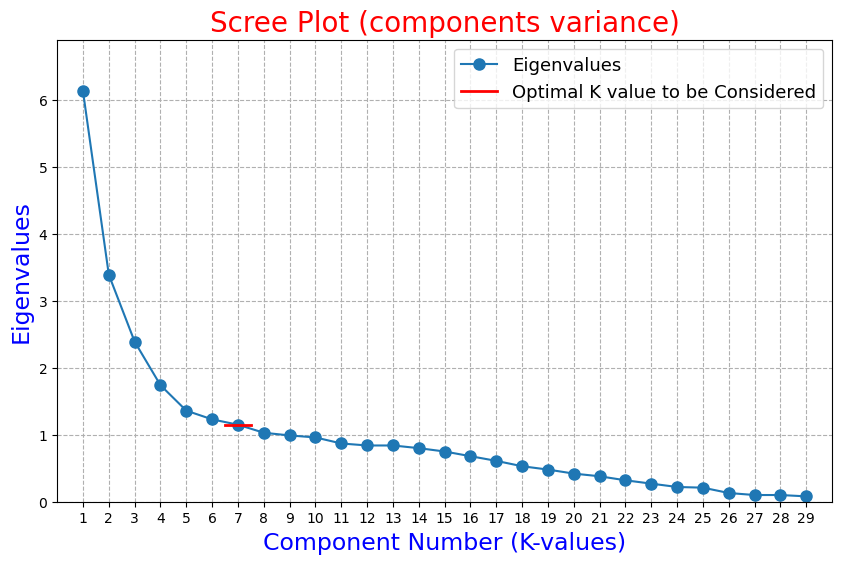

In [153]:
# Extract x and y values
x_values = range(1, len(sorted_eigenValues) + 1)
y_values = sorted_eigenValues

# Your code to create the graph
fig = plt.figure(figsize=(10, 6))
plt.title("Scree Plot (components variance)", color='Red', fontsize=20)
plt.xticks(np.arange(1, 30, 1))
plt.xlim(0, 30)
plt.ylim(0, 6.9)
plt.ylabel("Eigenvalues", fontsize=17, color='blue')
plt.xlabel("Component Number (K-values)", fontsize=17, color='blue')
plt.grid(linestyle='--')
plt.plot(x_values, y_values, linestyle='-',
         label="Eigenvalues", marker='o', markersize=8)
plt.plot([6.5, 7.5], [1.15, 1.15], color='red', linestyle='-',
         lw=2, label="Optimal K value to be Considered")
plt.legend(loc=1, prop={'size': 13})

# Save data to a CSV file
data = np.column_stack((x_values, y_values))
np.savetxt("scree_plot_data.csv", data, delimiter=',', header="Component Number, Eigenvalues", comments='')

plt.savefig("scree_plot.tif", format="tif")
plt.show()



Cumulative Variance Percentage : 
Component 1: 21.14%
Component 2: 32.83%
Component 3: 41.07%
Component 4: 47.07%
Component 5: 51.76%
Component 6: 56.0%
Component 7: 59.97%
Component 8: 63.52%
Component 9: 66.93%
Component 10: 70.24%
Component 11: 73.24%
Component 12: 76.14%
Component 13: 79.03%
Component 14: 81.79%
Component 15: 84.38%
Component 16: 86.72%
Component 17: 88.83%
Component 18: 90.66%
Component 19: 92.31%
Component 20: 93.76%
Component 21: 95.07%
Component 22: 96.17%
Component 23: 97.1%
Component 24: 97.86%
Component 25: 98.59%
Component 26: 99.03%
Component 27: 99.38%
Component 28: 99.72%
Component 29: 100.0%


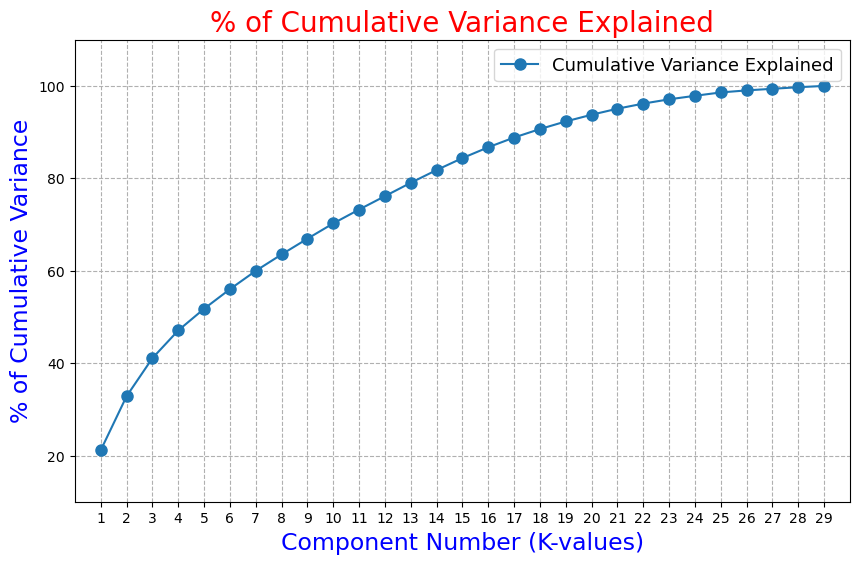

In [154]:
cumulative_variance = {}
ith_cumulative_variance = 0
for i in range(0, len(sorted_eig_pairs)):
    ith_explained_variance = sorted_eig_pairs[i][0] / sum(sorted_eigenValues)
    ith_cumulative_variance += ith_explained_variance
    cumulative_variance[str(i+1)] = round(ith_cumulative_variance * 100, 2)

print("\nCumulative Variance Percentage : ")
for component, variance in cumulative_variance.items():
    print("Component {}: {}%".format(component, variance))

# Extract x and y values for cumulative variance plot
x_values = range(1, 30)
y_values = sorted(list(cumulative_variance.values())[:30])

# Create the cumulative variance plot
fig = plt.figure(figsize=(10, 6))
plt.title("% of Cumulative Variance Explained", color='Red', fontsize=20)
plt.xticks(np.arange(1, 30, 1))
plt.xlim(0, 30)
plt.ylim(10, 110)
plt.ylabel("% of Cumulative Variance", fontsize=17, color='blue')
plt.xlabel("Component Number (K-values)", fontsize=17, color='blue')
plt.grid(linestyle='--')
plt.plot(x_values, y_values, linestyle='-',
         label="Cumulative Variance Explained", marker='o', markersize=8)
plt.legend(loc=1, prop={'size': 13})

# Save data for cumulative variance to a CSV file
cumulative_data = np.column_stack((x_values, y_values))
np.savetxt("cumulative_variance_data.csv", cumulative_data, delimiter=',', header="Component Number, Cumulative Variance", comments='')

plt.savefig("cumulative_variance_plot.tif", format="tif")
plt.show()


# Method-3 : Cumulative Variance Plot

## Projection matrix construction (K=15 from method- 3)

In [155]:
K = 15
projection_matrix = np.array(
    [list(np.hstack(i[1].reshape(29, 1))) for i in sorted_eig_pairs[:]])
projection_matrix = projection_matrix[:K]
print("\nProjection-Matrix Dimension ... ", projection_matrix.shape)
display(projection_matrix)



Projection-Matrix Dimension ...  (15, 29)


array([[-2.93926359e-01, -4.89210997e-02, -4.00735695e-02,
        -3.48962718e-02, -1.09134166e-01, -5.17180545e-02,
        -1.07387730e-01, -4.08809670e-02, -1.90429451e-01,
         3.16841450e-01,  1.28450382e-01,  1.64208695e-01,
        -5.98949525e-02, -8.90756380e-02, -5.01431551e-02,
        -2.58086294e-01,  2.94630443e-01,  2.85018079e-01,
        -2.14893936e-01, -3.08668398e-01,  2.24220619e-02,
        -2.42953566e-01,  1.97739496e-03, -1.41495358e-01,
         3.06263170e-01, -6.47720409e-02,  2.72907991e-01,
        -5.17549182e-02,  2.35880162e-01],
       [-1.36442660e-02, -2.37742711e-01,  1.74580224e-01,
        -4.23269228e-02,  6.37795045e-02, -2.26863116e-01,
        -2.52532214e-02, -2.14236139e-02, -1.28515849e-02,
         1.02935200e-01, -2.36362634e-01, -4.32469629e-01,
        -2.26409739e-01, -1.67549992e-01,  6.30458439e-03,
         6.99383842e-03, -2.55649935e-01,  8.01801595e-03,
        -1.69475481e-01,  2.58597036e-01, -3.54752732e-01,
        -3.30

# Projection Matrix as Dataframe

In [156]:
projection_matrix_df = pd.DataFrame(projection_matrix)
projection_matrix_df.columns = [str(i+1) for i in range(0, len(eig_vectors))]
projection_matrix_df = projection_matrix_df.set_index(
    [pd.Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15'])])

# Print the DataFrame
display(projection_matrix_df)
display(projection_matrix_df.T)

,1,2,3,4,5,6,7,8,9,10,...,20,21,22,23,24,25,26,27,28,29
PC1,-0.293926,-0.048921,-0.040074,-0.034896,-0.109134,-0.051718,-0.107388,-0.040881,-0.190429,0.316841,...,-0.308668,0.022422,-0.242954,0.001977,-0.141495,0.306263,-0.064772,0.272908,-0.051755,0.235880
PC2,-0.013644,-0.237743,0.174580,-0.042327,0.063780,-0.226863,-0.025253,-0.021424,-0.012852,0.102935,...,0.258597,-0.354753,-0.330487,-0.028571,0.026836,-0.071467,0.126261,0.295749,-0.109968,0.055469
PC3,0.264771,-0.010439,0.047892,-0.077203,0.210825,0.205383,0.022240,0.010349,-0.070711,0.096781,...,-0.028652,0.221553,-0.096343,0.110429,0.065057,0.296886,-0.059647,0.017918,-0.323987,-0.295006
PC4,-0.194213,0.124847,0.119672,0.012000,-0.266802,0.013967,-0.194507,0.037894,-0.057994,0.207735,...,0.036104,-0.004346,0.170397,0.033841,0.481594,0.192588,-0.076694,-0.116588,-0.331777,-0.036302
PC5,0.151703,0.018897,-0.183806,0.114858,-0.133771,-0.574160,-0.243645,-0.081263,-0.120663,-0.091228,...,-0.077191,0.038596,0.111858,0.131511,-0.343893,0.016999,-0.151508,-0.028653,-0.126103,-0.233491
PC6,0.000603,0.168592,0.393868,0.484266,-0.041765,0.087860,-0.001220,0.143742,-0.041025,0.057488,...,-0.085262,-0.067690,-0.124677,0.259159,-0.085387,-0.002639,0.397741,0.097205,-0.193086,-0.204213
PC7,-0.014408,-0.262597,-0.011666,0.346303,0.466553,0.160304,-0.285627,-0.378270,-0.151306,-0.030369,...,0.085704,0.167557,0.004784,-0.031368,0.239491,0.024120,-0.068219,0.156560,0.138516,0.009570
PC8,0.052416,0.334412,0.268797,-0.242088,-0.140542,-0.072177,-0.007309,-0.357528,-0.048908,0.084419,...,-0.020728,0.092415,-0.026720,-0.624219,0.013488,0.027179,0.249121,0.107079,0.057306,-0.211090
PC9,-0.051681,0.196793,-0.007083,0.206137,-0.214128,0.018158,0.386475,-0.691526,0.245818,0.000445,...,0.032015,0.040525,-0.016097,0.338304,-0.020430,0.006731,-0.052138,0.002066,0.049105,0.101910
PC10,0.028308,-0.324975,0.153997,0.122278,0.117230,-0.015971,0.356280,-0.142042,-0.067404,0.008841,...,-0.058338,-0.115534,-0.024434,-0.407819,-0.149935,-0.041414,-0.339396,-0.138755,-0.335550,0.011478


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
1,-0.293926,-0.013644,0.264771,-0.194213,0.151703,0.000603,-0.014408,0.052416,-0.051681,0.028308,0.033675,0.012120,0.015218,-0.037321,-0.035691
2,-0.048921,-0.237743,-0.010439,0.124847,0.018897,0.168592,-0.262597,0.334412,0.196793,-0.324975,0.261068,0.007263,0.027081,0.387835,0.333052
3,-0.040074,0.174580,0.047892,0.119672,-0.183806,0.393868,-0.011666,0.268797,-0.007083,0.153997,0.285971,-0.302750,-0.503033,-0.150408,-0.385428
4,-0.034896,-0.042327,-0.077203,0.012000,0.114858,0.484266,0.346303,-0.242088,0.206137,0.122278,0.471109,0.235263,0.379385,-0.157185,0.003941
5,-0.109134,0.063780,0.210825,-0.266802,-0.133771,-0.041765,0.466553,-0.140542,-0.214128,0.117230,-0.161904,-0.123615,-0.090446,0.281471,0.069457
6,-0.051718,-0.226863,0.205383,0.013967,-0.574160,0.087860,0.160304,-0.072177,0.018158,-0.015971,-0.053956,0.109145,0.075055,0.129213,0.013056
7,-0.107388,-0.025253,0.022240,-0.194507,-0.243645,-0.001220,-0.285627,-0.007309,0.386475,0.356280,0.036009,-0.528747,0.240237,0.182375,0.080162
8,-0.040881,-0.021424,0.010349,0.037894,-0.081263,0.143742,-0.378270,-0.357528,-0.691526,-0.142042,0.292527,-0.131874,0.156961,0.176816,-0.111574
9,-0.190429,-0.012852,-0.070711,-0.057994,-0.120663,-0.041025,-0.151306,-0.048908,0.245818,-0.067404,-0.023395,0.499693,-0.174839,0.328968,-0.536288
10,0.316841,0.102935,0.096781,0.207735,-0.091228,0.057488,-0.030369,0.084419,0.000445,0.008841,-0.018311,0.075857,0.018101,0.009397,0.122766


# Varimax rotation method ( for representing the adjusted correlations between variables and componaents. considering the value higher than 0.3 )

In [157]:
pca = PCA()
components = projection_matrix_df.T

rotator = Rotator(method='varimax')
rotated_loadings = rotator.fit_transform(components)
rotated_loadings_df = pd.DataFrame(rotated_loadings, columns=[
                                   'PC{}'.format(i+1) for i in range(rotated_loadings.shape[1])])
rotated_loadings_df = rotated_loadings_df.where(
    rotated_loadings_df.abs() > 0.3, np.nan)
rotated_loadings_df = rotated_loadings_df.fillna(0)
display(rotated_loadings_df)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
0,0.000000,0.000000,0.430380,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.841890,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.958775,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.966138,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,-0.420757,0.000000,0.397646,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,-0.673852,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.906993,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.982867,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.881370
9,0.318438,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [158]:
rotated_loadings_df.to_csv('varimax.csv')

# Variance percentage of first fifteen components

In [159]:
cumulative_variance = {}
for i in range(0, 15):
    ith_explained_variance = sorted_eig_pairs[i][0] / sum(sorted_eigenValues)
    ith_variance_percentage = round(ith_explained_variance * 100, 2)
    cumulative_variance[str(i + 1)] = ith_variance_percentage

print("\nVariance Percentage for the First Thirteen Components: ")
for component, variance in cumulative_variance.items():
    print("Component {}: {}%".format(component, variance))


Variance Percentage for the First Thirteen Components: 
Component 1: 21.14%
Component 2: 11.69%
Component 3: 8.24%
Component 4: 6.0%
Component 5: 4.69%
Component 6: 4.24%
Component 7: 3.97%
Component 8: 3.55%
Component 9: 3.41%
Component 10: 3.31%
Component 11: 3.0%
Component 12: 2.9%
Component 13: 2.9%
Component 14: 2.76%
Component 15: 2.59%


# Calculating W (weight) of each component
W=proportion of variance for each component/Total variance explained

In [160]:
summation_variance = 0
for i in range(0, 15):  
    ith_explained_variance = sorted_eig_pairs[i][0]
    summation_variance += ith_explained_variance

W = {}
for i in range(0, 15):
    ith_explained_variance = sorted_eig_pairs[i][0]
    ith_variance_percentage = ith_explained_variance / summation_variance
    W[str(i+1)] = ith_variance_percentage

data = []
for component, w in W.items():
    data.append(w)

df2= pd.DataFrame(data, columns=['weight'])
df2

,weight
0,0.250511
1,0.138537
2,0.097671
3,0.071107
4,0.055578
5,0.050266
6,0.046996
7,0.042092
8,0.040458
9,0.039232


# Result (sigma (Wi*PCi) )

In [161]:
result = np.nan_to_num(rotated_loadings_df) @ np.nan_to_num(df2)
result_df = pd.DataFrame(result, columns=['Result'])
display(result_df)

,Result
0,0.042036
1,-0.039566
2,-0.032913
3,0.048564
4,-0.004697
5,-0.037451
6,-0.031135
7,-0.039765
8,-0.027014
9,0.079772


# Social Vulnerability Index (SVI) 
    Original data*Result

In [162]:
scaled_df_without_geo_name = scaled_df.drop(columns=['GEO_NAME'])

# Perform matrix multiplication
SVI = np.matmul(scaled_df_without_geo_name.to_numpy(), result_df.to_numpy())

# Create a DataFrame from the result with an additional 'GEO_NAME' column
SVI_df = pd.DataFrame(SVI, columns=['SVI'])
SVI_df['GEO_NAME'] = scaled_df['GEO_NAME']
SVI_df = SVI_df[['GEO_NAME', 'SVI']]
display(SVI_df)

# Min-Max Scaler
scaler = MinMaxScaler(feature_range=(0, 100))
scaled_data = scaler.fit_transform(SVI_df[['SVI']])
df_scaled = pd.DataFrame(scaled_data, columns=['SVI'])
df_scaled['GEO_NAME'] = SVI_df['GEO_NAME']
df_scaled = df_scaled[['GEO_NAME', 'SVI']]
display(df_scaled)



,GEO_NAME,SVI
0,59150307,-0.317807
1,59150308,-0.293245
2,59150309,0.112231
3,59150310,0.146181
4,59150311,-0.197226
...,...,...
1018,59154192,-0.105132
1019,59154193,-0.128098
1020,59154194,-0.439374
1021,59154195,-0.029590


,GEO_NAME,SVI
0,59150307,43.584797
1,59150308,44.321446
2,59150309,56.482273
3,59150310,57.500477
4,59150311,47.201179
...,...,...
1018,59154192,49.963229
1019,59154193,49.274457
1020,59154194,39.938811
1021,59154195,52.228860


In [163]:
# Sort the 'Result' column in descending order (larger to smaller)
result_df = result_df.sort_values(by='Result', ascending=False)

# Reset the index to maintain a clean DataFrame
result_df = result_df.reset_index(drop=True)

# Display the sorted DataFrame
display(result_df)


,Result
0,0.080947
1,0.079772
2,0.058037
3,0.048564
4,0.042036
5,0.037774
6,0.032442
7,0.027748
8,0.000000
9,-0.004697


In [164]:
df_scaled.to_csv('SVI.csv')

#  SVI mapping

In [165]:
with open('SVI-map.geojson') as f:
    data = geojson.load(f)
    
records = []
for record in data['features']:
  records.append(record['properties'])
df = pd.DataFrame(records)
df

,fid,DAUID,DGUID,LANDAREA,PRUID,lon,lat,Area_DA,GEO_NAME,SVI
0,1.0,59150307,2021S051259150307,0.2991,59,-123.025980,49.288743,295589.227,59150307,43.584797
1,2.0,59150308,2021S051259150308,0.1096,59,-123.025839,49.284312,109179.076,59150308,44.321446
2,3.0,59150309,2021S051259150309,0.1119,59,-123.029587,49.282958,111904.378,59150309,56.482273
3,4.0,59150310,2021S051259150310,0.1094,59,-123.025860,49.281583,109224.744,59150310,57.500477
4,5.0,59150311,2021S051259150311,0.0809,59,-123.028832,49.279066,80935.219,59150311,47.201179
...,...,...,...,...,...,...,...,...,...,...
1020,1021.0,59154192,2021S051259154192,0.0641,59,-123.128923,49.265200,64147.850,59154192,49.963229
1021,1022.0,59154193,2021S051259154193,0.0847,59,-123.124411,49.264500,84714.221,59154193,49.274457
1022,1023.0,59154194,2021S051259154194,0.0973,59,-123.047445,49.234941,97291.905,59154194,39.938811
1023,1024.0,59154195,2021S051259154195,0.1240,59,-123.045426,49.231413,123987.181,59154195,52.228860


In [166]:
# Create a FeatureCollection object
with open('SVI-map.geojson') as f:
    data = geojson.load(f)

feature_collection = geojson.feature.FeatureCollection(data['features'])

In [167]:
# Creating the dataframe of the data containing the GEO andm and the Metric
records = []
for record in feature_collection['features']:

  record_info = {}
  record_info['DAUID'] = record['properties']['DAUID']
  record_info['SVI'] = record['properties']['SVI']
  record['id'] = record['properties']['DAUID']
  records.append(record_info)

Geo_data_df = pd.DataFrame(records)
Geo_data_df

,DAUID,SVI
0,59150307,43.584797
1,59150308,44.321446
2,59150309,56.482273
3,59150310,57.500477
4,59150311,47.201179
...,...,...
1020,59154192,49.963229
1021,59154193,49.274457
1022,59154194,39.938811
1023,59154195,52.228860


In [168]:
access_token = "pk.eyJ1IjoiYXJtaXNpbmFlaSIsImEiOiJjbGlpeXBhcWQwMnFhM21waDM4MWtzdXR6In0.ABSEkduUBc8wsJVvf7MIJA"
px.set_mapbox_access_token(access_token)

fig = px.choropleth_mapbox(Geo_data_df, geojson = feature_collection, locations='DAUID', color='SVI',
                           color_continuous_scale="Viridis_r",
                           range_color=(0, 100),
                           mapbox_style="carto-positron",
                           zoom=10, center = {"lat": 49.2827, "lon": -123.1207},
                           opacity=0.5,
                           labels={'SVI':'SVI rate'}
                          )

color_scale_tick_labels = {
    0: "Very Low",
    25: "Low",
    50: "Medium",
    75: "High",
    100: "Very High"
    }
fig.update_layout(coloraxis_colorbar_ticks="outside", coloraxis_colorbar_tickvals=list(color_scale_tick_labels.keys()), 
                  coloraxis_colorbar_ticktext=list(color_scale_tick_labels.values()))
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

    
fig.show()

# Environmental Vulnerability Index (EVI)

In [169]:
df = pd.read_csv('parks_floodplain_area.csv', encoding='latin-1', low_memory=False)
df_filled = df.fillna(0)
df_filled

,fid,DAUID,DGUID,LANDAREA,PRUID,lon,lat,area-DAs(s,flood-area,flood-prc,parks-area
0,1,59150307,2021S051259150307,0.2991,59,-123.025980,49.288743,295589.227,2902.849389,0.982055,3464.191
1,2,59150308,2021S051259150308,0.1096,59,-123.025839,49.284312,109179.076,0.000000,0.000000,0.000
2,3,59150309,2021S051259150309,0.1119,59,-123.029587,49.282958,111904.378,0.000000,0.000000,0.000
3,4,59150310,2021S051259150310,0.1094,59,-123.025860,49.281583,109224.744,0.000000,0.000000,0.000
4,5,59150311,2021S051259150311,0.0809,59,-123.028832,49.279066,80935.219,0.000000,0.000000,0.000
...,...,...,...,...,...,...,...,...,...,...,...
1020,1021,59154192,2021S051259154192,0.0641,59,-123.128923,49.265200,64147.850,0.000000,0.000000,673.900
1021,1022,59154193,2021S051259154193,0.0847,59,-123.124411,49.264500,84714.221,0.000000,0.000000,2255.176
1022,1023,59154194,2021S051259154194,0.0973,59,-123.047445,49.234941,97291.905,0.000000,0.000000,15884.013
1023,1024,59154195,2021S051259154195,0.1240,59,-123.045426,49.231413,123987.181,0.000000,0.000000,0.000


In [170]:
selected_columns = ['DAUID', 'parks-area', 'flood-area']
subset_df = df_filled[selected_columns]
subset_df

,DAUID,parks-area,flood-area
0,59150307,3464.191,2902.849389
1,59150308,0.000,0.000000
2,59150309,0.000,0.000000
3,59150310,0.000,0.000000
4,59150311,0.000,0.000000
...,...,...,...
1020,59154192,673.900,0.000000
1021,59154193,2255.176,0.000000
1022,59154194,15884.013,0.000000
1023,59154195,0.000,0.000000


# Scaling the value of parks and floodplains

In [171]:
columns_to_scale = ['parks-area', 'flood-area']
subset_df = df_filled[columns_to_scale]
scaler = MinMaxScaler(feature_range=(0, 100))
scaled_data = scaler.fit_transform(subset_df.values)
df_scaled = pd.DataFrame(scaled_data, columns=columns_to_scale)
df_scaled

,parks-area,flood-area
0,0.080874,0.185394
1,0.000000,0.000000
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000000,0.000000
...,...,...
1020,0.015733,0.000000
1021,0.052649,0.000000
1022,0.370825,0.000000
1023,0.000000,0.000000


In [172]:
# summation two environmenal factors

df_scaled['EVI'] = df_scaled[['parks-area', 'flood-area']].sum(axis=1)
df_scaled.drop(['parks-area', 'flood-area'], axis=1, inplace=True)
df_scaled

,EVI
0,0.266268
1,0.000000
2,0.000000
3,0.000000
4,0.000000
...,...
1020,0.015733
1021,0.052649
1022,0.370825
1023,0.000000


In [173]:
# Min-Max Scaler
scaler = MinMaxScaler(feature_range=(0, 100))
scaled_data = scaler.fit_transform(df_scaled)
EVI_scaled = pd.DataFrame(scaled_data)
EVI_scaled.columns = ['EVI']
EVI_scaled

,EVI
0,0.265872
1,0.000000
2,0.000000
3,0.000000
4,0.000000
...,...
1020,0.015709
1021,0.052570
1022,0.370273
1023,0.000000


In [174]:
EVI_scaled.to_csv('EVI.csv')

In [175]:
source_df = pd.read_csv('parks_floodplain_area.csv')
target_df = pd.read_csv('EVI.csv')

# Extract the column we want to add from the source DataFrame
column_to_add = source_df['DAUID']

insert_index = 0

# Insert the extracted column as a new column in the target DataFrame
target_df.insert(insert_index, 'DAUID', column_to_add)

target_df.drop(['Unnamed: 0'], axis = 1, inplace = True)

# Save the modified target DataFrame to a new CSV file
target_df.to_csv('EVI.csv', index=False)

# EVI Mapping

In [176]:
with open('EVI.geojson') as f:
    data = geojson.load(f)
    
records = []
for record in data['features']:
  records.append(record['properties'])
df = pd.DataFrame(records)
df

,fid,DAUID,DGUID,LANDAREA,PRUID,lon,lat,Area_DA,DAUID_2,EVI
0,1.0,59150307,2021S051259150307,0.2991,59,-123.025980,49.288743,295589.227,59150307,0.265872
1,2.0,59150308,2021S051259150308,0.1096,59,-123.025839,49.284312,109179.076,59150308,0.000000
2,3.0,59150309,2021S051259150309,0.1119,59,-123.029587,49.282958,111904.378,59150309,0.000000
3,4.0,59150310,2021S051259150310,0.1094,59,-123.025860,49.281583,109224.744,59150310,0.000000
4,5.0,59150311,2021S051259150311,0.0809,59,-123.028832,49.279066,80935.219,59150311,0.000000
...,...,...,...,...,...,...,...,...,...,...
1020,1021.0,59154192,2021S051259154192,0.0641,59,-123.128923,49.265200,64147.850,59154192,0.015709
1021,1022.0,59154193,2021S051259154193,0.0847,59,-123.124411,49.264500,84714.221,59154193,0.052570
1022,1023.0,59154194,2021S051259154194,0.0973,59,-123.047445,49.234941,97291.905,59154194,0.370273
1023,1024.0,59154195,2021S051259154195,0.1240,59,-123.045426,49.231413,123987.181,59154195,0.000000


In [177]:
# Create a FeatureCollection object
with open('EVI.geojson') as f:
    data = geojson.load(f)

feature_collection = geojson.feature.FeatureCollection(data['features'])

In [178]:
# Creating the dataframe of the data containing the GEO andm and the Metric
records = []
for record in feature_collection['features']:

  record_info = {}
  record_info['DAUID'] = record['properties']['DAUID']
  record_info['EVI'] = record['properties']['EVI']
  record['id'] = record['properties']['DAUID']
  records.append(record_info)

Geo_data_df = pd.DataFrame(records)
Geo_data_df

,DAUID,EVI
0,59150307,0.265872
1,59150308,0.000000
2,59150309,0.000000
3,59150310,0.000000
4,59150311,0.000000
...,...,...
1020,59154192,0.015709
1021,59154193,0.052570
1022,59154194,0.370273
1023,59154195,0.000000


In [179]:
# Token
access_token = "pk.eyJ1IjoiYXJtaXNpbmFlaSIsImEiOiJjbGlpeXBhcWQwMnFhM21waDM4MWtzdXR6In0.ABSEkduUBc8wsJVvf7MIJA"
px.set_mapbox_access_token(access_token)

fig = px.choropleth_mapbox(Geo_data_df, geojson = feature_collection, locations='DAUID', color='EVI',
                           color_continuous_scale=[[0, 'lightblue'], [0.5, 'lightgreen'], [1, 'darkgreen']],
                           range_color=(0, 100),
                           mapbox_style="carto-positron",
                           zoom=10, center = {"lat": 49.2827, "lon": -123.1207},
                           opacity=0.5,
                           labels={'EVI':'EVI rate'}
                          )
color_scale_tick_labels = {
    0: "Very Low",
    25: "Low",
    50: "Medium",
    75: "High",
    100: "Very High"
    }
fig.update_layout(coloraxis_colorbar_ticks="outside", coloraxis_colorbar_tickvals=list(color_scale_tick_labels.keys()), 
                  coloraxis_colorbar_ticktext=list(color_scale_tick_labels.values()))

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# Economic Vulnerability Index ( ECI )

In [180]:
# Reading the catalogue data 
Catalogue = pd.read_csv('Cost_Analysis_Catalogue&main.csv')

# Reading the water main data
Water_main = pd.read_csv('WMAIN-120M.csv')

In [181]:
# Focus on a subset of the data that we need from the catalogue data 
Partial_catalogue = Catalogue[['Old Diameter (mm)', 'New Diameter (mm)', 'Replacement Material', 'Cost / meter']]

In [182]:
# Perform the join based on the diameters and drop the repeated column 
Joined_df = Water_main.merge(Partial_catalogue, left_on=['DIAMETER'], right_on = ['Old Diameter (mm)'], how='left')

In [183]:
# Computing the cost of the replacement 
Joined_df['Total Cost'] = Joined_df['length-split'] * Joined_df['Cost / meter']

# Drop the columns that are not needed for us 
#Joined_df.drop(['Old Diameter (mm)'], axis = 1, inplace = True)
#Joined_df['DAUID'] = Joined_df['DAUID'].replace([np.inf, -np.inf], np.nan)
#Joined_df['DAUID'] = Joined_df['DAUID'].astype(float)
#Joined_df['DAUID'] = Joined_df['DAUID'].fillna(0).astype(int)
#Joined_df['DAUID'] = Joined_df['DAUID'].astype(str)


Joined_df

,fid,cat,OBJECTID,GlobalID,FACILITYID,INSTALLDAT,MATERIAL,DIAMETER,WATERTYPE,TRANSMISS,...,COMPKEY,COMPTYPE,SHAPE_STLe,length,length-split,Old Diameter (mm),New Diameter (mm),Replacement Material,Cost / meter,Total Cost
0,1,1,1649164,{66EFEE42-E096-4791-A7B3-0000F9D5E88F},376871,19660101.0,CAS,150.0,NaN,NaN,...,242909.0,41.0,1.250000,1.250000,1.250000,150.0,150.0,"PVC,Pressure pipe class 150",3.639312,4.549140
1,2,2,1600210,{18AE3588-4762-4BEB-9ADE-000116D42418},371795,19870101.0,DIP,200.0,NaN,NaN,...,236984.0,41.0,2.750654,2.750654,2.750654,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,14.110263
2,3,3,1638604,{967F0D8B-34FB-4235-9CC3-0001FFD7D838},357590,20000101.0,DIP,200.0,NaN,NaN,...,220128.0,41.0,21.670994,21.670994,21.670994,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,111.167520
3,4,4,1611806,{C9B69F7B-D81A-4116-A0EC-0002FD255804},391639,19610101.0,CAS,200.0,NaN,NaN,...,263941.0,41.0,49.089992,49.089992,49.089992,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,251.821058
4,5,5,1666111,{64A26E67-A4DB-4C81-8AF3-00040E7AAB0F},4246354,20130924.0,DICL,200.0,NaN,NaN,...,840747.0,41.0,35.155923,35.155923,35.155923,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,180.342292
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79848,79849,76044,1613075,{F8656EFF-93E4-4BD4-AA8F-FFFA22FB7074},390031,19970101.0,DIP,200.0,NaN,NaN,...,261660.0,41.0,20.054164,20.054164,20.054164,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,102.873531
79849,79850,76045,1666515,{79ED7071-487E-40C8-9C2E-FFFAEDA1CBB1},4274267,20140711.0,DICL,150.0,NaN,NaN,...,861598.0,41.0,16.999949,16.999949,16.999949,150.0,150.0,"PVC,Pressure pipe class 150",3.639312,61.868117
79850,79851,76046,1605696,{6924C40D-26BA-4100-9DC7-FFFB7BC45AF7},412930,19510101.0,CAS,150.0,NaN,NaN,...,289724.0,41.0,37.666624,37.666624,37.666624,150.0,150.0,"PVC,Pressure pipe class 150",3.639312,137.080595
79851,79852,76047,1638521,{B6B736A6-6320-4633-88F1-FFFEFB330B64},374458,19800101.0,DIP,200.0,NaN,NaN,...,240934.0,41.0,4.390410,4.390410,4.390410,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,22.521855


# MinMax Scaler for ECI

In [184]:
# Taking an instance of the scaling approach and set the range of the scaling between (0, 100)
scaler = MinMaxScaler(feature_range = (0, 100))
 
Joined_df['ECI'] = scaler.fit_transform(np.array(Joined_df['Total Cost']).reshape((-1, 1)))

Joined_df

,fid,cat,OBJECTID,GlobalID,FACILITYID,INSTALLDAT,MATERIAL,DIAMETER,WATERTYPE,TRANSMISS,...,COMPTYPE,SHAPE_STLe,length,length-split,Old Diameter (mm),New Diameter (mm),Replacement Material,Cost / meter,Total Cost,ECI
0,1,1,1649164,{66EFEE42-E096-4791-A7B3-0000F9D5E88F},376871,19660101.0,CAS,150.0,NaN,NaN,...,41.0,1.250000,1.250000,1.250000,150.0,150.0,"PVC,Pressure pipe class 150",3.639312,4.549140,0.015720
1,2,2,1600210,{18AE3588-4762-4BEB-9ADE-000116D42418},371795,19870101.0,DIP,200.0,NaN,NaN,...,41.0,2.750654,2.750654,2.750654,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,14.110263,0.048787
2,3,3,1638604,{967F0D8B-34FB-4235-9CC3-0001FFD7D838},357590,20000101.0,DIP,200.0,NaN,NaN,...,41.0,21.670994,21.670994,21.670994,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,111.167520,0.384453
3,4,4,1611806,{C9B69F7B-D81A-4116-A0EC-0002FD255804},391639,19610101.0,CAS,200.0,NaN,NaN,...,41.0,49.089992,49.089992,49.089992,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,251.821058,0.870895
4,5,5,1666111,{64A26E67-A4DB-4C81-8AF3-00040E7AAB0F},4246354,20130924.0,DICL,200.0,NaN,NaN,...,41.0,35.155923,35.155923,35.155923,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,180.342292,0.623690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79848,79849,76044,1613075,{F8656EFF-93E4-4BD4-AA8F-FFFA22FB7074},390031,19970101.0,DIP,200.0,NaN,NaN,...,41.0,20.054164,20.054164,20.054164,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,102.873531,0.355769
79849,79850,76045,1666515,{79ED7071-487E-40C8-9C2E-FFFAEDA1CBB1},4274267,20140711.0,DICL,150.0,NaN,NaN,...,41.0,16.999949,16.999949,16.999949,150.0,150.0,"PVC,Pressure pipe class 150",3.639312,61.868117,0.213954
79850,79851,76046,1605696,{6924C40D-26BA-4100-9DC7-FFFB7BC45AF7},412930,19510101.0,CAS,150.0,NaN,NaN,...,41.0,37.666624,37.666624,37.666624,150.0,150.0,"PVC,Pressure pipe class 150",3.639312,137.080595,0.474072
79851,79852,76047,1638521,{B6B736A6-6320-4633-88F1-FFFEFB330B64},374458,19800101.0,DIP,200.0,NaN,NaN,...,41.0,4.390410,4.390410,4.390410,200.0,200.0,"PVC,Pressure pipe class 150",5.129784,22.521855,0.077878


In [185]:
Joined_df.to_csv('ECI.csv', index = False)

# Error

In [110]:
import geojson
import pandas as pd
import plotly.graph_objects as go

# Load GeoJSON data
with open('ECI-120M.geojson') as f:
    data = geojson.load(f)

feature_collection = geojson.feature.FeatureCollection(data['features'])

# Extract data for Line Mapbox plot
df_records = []

for index, record in enumerate(feature_collection['features']):
    eci_value = record['properties'].get('ECI')
    if eci_value is not None and eci_value >= 20:
        for location in record['geometry']['coordinates'][0]:
            df_record = {}
            df_record['lon'], df_record['lat'] = location[0], location[1]
            df_record['cat'] = index
            df_record['ECI'] = eci_value
            df_records.append(df_record)

Line_plot_data = pd.DataFrame(df_records)

# Create a Line Mapbox plot with a gradient color scale
fig = go.Figure()

color_scale = [[0, 'blue'], [0.2, 'royalblue'], [0.4, 'cyan'], [0.6, 'lime'], [0.8, 'yellow'], [1, 'red']]

for color_level, color in color_scale:
    subset = Line_plot_data[Line_plot_data['ECI'] >= color_level]
    trace = go.Scattermapbox(
        lat=subset['lat'],
        lon=subset['lon'],
        mode='lines',
        line=dict(color=color, width=5),
        marker=dict(size=1),
        hoverinfo='none',
    )
    fig.add_trace(trace)

# Customize the map layout
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": Line_plot_data['lat'].mean(), "lon": Line_plot_data['lon'].mean()},
    showlegend=True,
    mapbox=dict(
        center={"lat": Line_plot_data['lat'].mean(), "lon": Line_plot_data['lon'].mean()},
        zoom=10,
    ),
)

# Show the figure
fig.show()


# Aggregating SVI_EVI_ECI (SVCI)

In [3]:
SVCI = pd.read_csv('SVCI-120M.csv')
SVCI = SVCI.sort_values('ECI', ascending=False).round(2)
SVCI

,fid,cat,OBJECTID,GlobalID,FACILITYID,INSTALLDAT,MATERIAL,DIAMETER,WATERTYPE,TRANSMISS,...,SHAPE_STLe,length,length-spl,DAUID,ECI,lon,lat,SVI,EVI,SVCI
67012,23820,22715,1602428,{1A44DCCB-F3C4-437D-912B-4D4959BE4085},382688,19710101.0,CONC,1950.0,NaN,NaN,...,302.82,302.82,120.00,59153400.0,100.00,-123.14,49.28,36.46,3.73,75.20
35325,23822,22715,1602428,{1A44DCCB-F3C4-437D-912B-4D4959BE4085},382688,19710101.0,CONC,1950.0,NaN,NaN,...,302.82,302.82,62.82,59150871.0,100.00,-123.14,49.28,56.99,10.27,75.20
79720,23821,22715,1602428,{1A44DCCB-F3C4-437D-912B-4D4959BE4085},382688,19710101.0,CONC,1950.0,NaN,NaN,...,302.82,302.82,120.00,NaN,100.00,-123.14,49.28,NaN,NaN,75.20
35288,53243,50677,1611485,{16C3F60B-40D5-45FA-A743-AA44BB0F253C},383214,19710101.0,SP,1950.0,NaN,NaN,...,97.78,97.78,97.78,59150871.0,81.48,-123.14,49.28,56.99,10.27,66.87
35281,26333,25102,1611489,{0B62D6A2-07C1-4CA3-81F5-5583865FDA2E},383218,19710101.0,SP,1950.0,NaN,NaN,...,94.68,94.68,94.68,59150871.0,78.90,-123.14,49.28,56.99,10.27,65.71
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53197,64154,61098,1668392,{37C26473-6FDF-4C57-BDC1-CE0A7650F426},4272820,20080701.0,SP,NaN,NaN,NaN,...,7.87,7.87,7.87,59151485.0,NaN,-123.03,49.27,47.27,0.74,21.59
53198,68392,65109,1668389,{3191A738-F3A9-46EB-8B04-DB52092BA218},4272805,20080701.0,SP,NaN,NaN,NaN,...,2.08,2.08,2.08,59151485.0,NaN,-123.03,49.27,47.27,0.74,21.59
53259,14991,14273,1668383,{9A0046CC-4F5D-41FD-A1F9-30FF94D8A4BD},4272774,20080701.0,SP,NaN,NaN,NaN,...,0.62,0.62,0.62,59151485.0,NaN,-123.03,49.27,47.27,0.74,21.59
53261,41496,39526,1668385,{706B35AC-8402-4BF7-A1B6-854CF850D31E},4272785,20080701.0,SP,NaN,NaN,NaN,...,0.87,0.87,0.87,59151485.0,NaN,-123.03,49.27,47.27,0.74,21.59


In [4]:
SVCI['SVCI'] = SVCI[['SVI','EVI','ECI']].sum(axis=1)
#SVCI.drop(['SVI','EVI','ECI'], axis=1, inplace=True)
SVCI = SVCI.sort_values('SVCI', ascending=False).round(2)
SVCI

,fid,cat,OBJECTID,GlobalID,FACILITYID,INSTALLDAT,MATERIAL,DIAMETER,WATERTYPE,TRANSMISS,...,SHAPE_STLe,length,length-spl,DAUID,ECI,lon,lat,SVI,EVI,SVCI
66986,41157,39206,1611172,{866E74CD-B512-4E19-8113-84434A82E496},383958,19750101.0,SP,1800.0,NaN,NaN,...,558.85,558.85,120.00,59153394.0,75.14,-123.14,49.29,47.31,99.97,222.42
66982,41158,39206,1611172,{866E74CD-B512-4E19-8113-84434A82E496},383958,19750101.0,SP,1800.0,NaN,NaN,...,558.85,558.85,120.00,59153394.0,75.14,-123.14,49.29,47.31,99.97,222.42
66983,41159,39206,1611172,{866E74CD-B512-4E19-8113-84434A82E496},383958,19750101.0,SP,1800.0,NaN,NaN,...,558.85,558.85,120.00,59153394.0,75.14,-123.14,49.29,47.31,99.97,222.42
69613,41160,39206,1611172,{866E74CD-B512-4E19-8113-84434A82E496},383958,19750101.0,SP,1800.0,NaN,NaN,...,558.85,558.85,120.00,59153586.0,75.14,-123.14,49.29,47.51,99.44,222.09
69621,41161,39206,1611172,{866E74CD-B512-4E19-8113-84434A82E496},383958,19750101.0,SP,1800.0,NaN,NaN,...,558.85,558.85,78.85,59153586.0,75.14,-123.14,49.29,47.51,99.44,222.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74016,41194,39238,1616329,{C71CEF6B-D246-43D9-8421-845F32192123},4134538,20101125.0,DICL,200.0,NaN,NaN,...,0.40,0.40,0.40,59154026.0,0.01,-123.11,49.28,NaN,0.00,0.01
33481,70434,67069,1626589,{8E6CF8E2-689A-44C6-B12A-E1F241F41B61},373894,19880101.0,DIP,200.0,NaN,NaN,...,0.60,0.60,0.60,59150760.0,0.01,-123.09,49.28,0.00,0.00,0.01
74011,15424,14691,1667729,{445DAD7B-FBB6-4B42-A02A-3276BC87446F},4305343,19470101.0,CAS,200.0,NaN,NaN,...,0.22,0.22,0.22,59154026.0,0.00,-123.11,49.28,NaN,0.00,0.00
74018,15694,14949,1616331,{B16C95F9-C33D-4EC6-8960-334ABB852D19},4134554,20101125.0,DICL,200.0,NaN,NaN,...,0.20,0.20,0.20,59154026.0,0.00,-123.11,49.28,NaN,0.00,0.00


In [5]:
# Scaling SVCI and set the range between 0 to 100

scaler = MinMaxScaler(feature_range = (0, 100))
SVCI['SVCI'] = scaler.fit_transform(np.array(SVCI['SVCI']).reshape((-1, 1)))
SVCI = SVCI.sort_values('SVCI', ascending=False).round(2)
SVCI

,fid,cat,OBJECTID,GlobalID,FACILITYID,INSTALLDAT,MATERIAL,DIAMETER,WATERTYPE,TRANSMISS,...,SHAPE_STLe,length,length-spl,DAUID,ECI,lon,lat,SVI,EVI,SVCI
66986,41157,39206,1611172,{866E74CD-B512-4E19-8113-84434A82E496},383958,19750101.0,SP,1800.0,NaN,NaN,...,558.85,558.85,120.00,59153394.0,75.14,-123.14,49.29,47.31,99.97,100.00
66983,41159,39206,1611172,{866E74CD-B512-4E19-8113-84434A82E496},383958,19750101.0,SP,1800.0,NaN,NaN,...,558.85,558.85,120.00,59153394.0,75.14,-123.14,49.29,47.31,99.97,100.00
66982,41158,39206,1611172,{866E74CD-B512-4E19-8113-84434A82E496},383958,19750101.0,SP,1800.0,NaN,NaN,...,558.85,558.85,120.00,59153394.0,75.14,-123.14,49.29,47.31,99.97,100.00
69613,41160,39206,1611172,{866E74CD-B512-4E19-8113-84434A82E496},383958,19750101.0,SP,1800.0,NaN,NaN,...,558.85,558.85,120.00,59153586.0,75.14,-123.14,49.29,47.51,99.44,99.85
69621,41161,39206,1611172,{866E74CD-B512-4E19-8113-84434A82E496},383958,19750101.0,SP,1800.0,NaN,NaN,...,558.85,558.85,78.85,59153586.0,75.14,-123.14,49.29,47.51,99.44,99.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74010,21544,20548,1667730,{5BDBD358-C2F8-4D7E-9FD2-462294BC83F3},4305360,19470101.0,CAS,200.0,NaN,NaN,...,0.80,0.80,0.80,59154026.0,0.01,-123.11,49.28,NaN,0.00,0.00
73995,41892,39909,1605318,{3468468B-602C-4A3B-BEB1-8683AF0866F0},409993,20060505.0,DICL,200.0,NaN,NaN,...,0.67,0.67,0.67,59154026.0,0.01,-123.11,49.28,NaN,0.00,0.00
74011,15424,14691,1667729,{445DAD7B-FBB6-4B42-A02A-3276BC87446F},4305343,19470101.0,CAS,200.0,NaN,NaN,...,0.22,0.22,0.22,59154026.0,0.00,-123.11,49.28,NaN,0.00,0.00
74018,15694,14949,1616331,{B16C95F9-C33D-4EC6-8960-334ABB852D19},4134554,20101125.0,DICL,200.0,NaN,NaN,...,0.20,0.20,0.20,59154026.0,0.00,-123.11,49.28,NaN,0.00,0.00


In [6]:
SVCI.to_csv('SVCI-COMB.csv')

# Probability of failure & Risk

In [7]:
SVCI['INSTALLDAT'] = SVCI['INSTALLDAT'].fillna(0).astype(int)
SVCI['INSTALLYEAR'] = SVCI['INSTALLDAT'].apply(lambda x: int(str(x)[:4]))

# Calculate AGE column by subtracting INSTALLYEAR from 2023
current_year = 2023
SVCI['AGE'] = current_year - SVCI['INSTALLYEAR']
SVCI['AGE'] = np.where(SVCI['INSTALLYEAR'] == 0, 0, SVCI['AGE'])

selected_columns = ['OBJECTID', 'DAUID', 'INSTALLDAT', 'INSTALLYEAR', 'AGE', 'SVI', 'EVI','ECI', 'SVCI']
selected_df = SVCI[selected_columns]

selected_df

,OBJECTID,DAUID,INSTALLDAT,INSTALLYEAR,AGE,SVI,EVI,ECI,SVCI
66986,1611172,59153394.0,19750101,1975,48,47.31,99.97,75.14,100.00
66983,1611172,59153394.0,19750101,1975,48,47.31,99.97,75.14,100.00
66982,1611172,59153394.0,19750101,1975,48,47.31,99.97,75.14,100.00
69613,1611172,59153586.0,19750101,1975,48,47.51,99.44,75.14,99.85
69621,1611172,59153586.0,19750101,1975,48,47.51,99.44,75.14,99.85
...,...,...,...,...,...,...,...,...,...
74010,1667730,59154026.0,19470101,1947,76,NaN,0.00,0.01,0.00
73995,1605318,59154026.0,20060505,2006,17,NaN,0.00,0.01,0.00
74011,1667729,59154026.0,19470101,1947,76,NaN,0.00,0.00,0.00
74018,1616331,59154026.0,20101125,2010,13,NaN,0.00,0.00,0.00


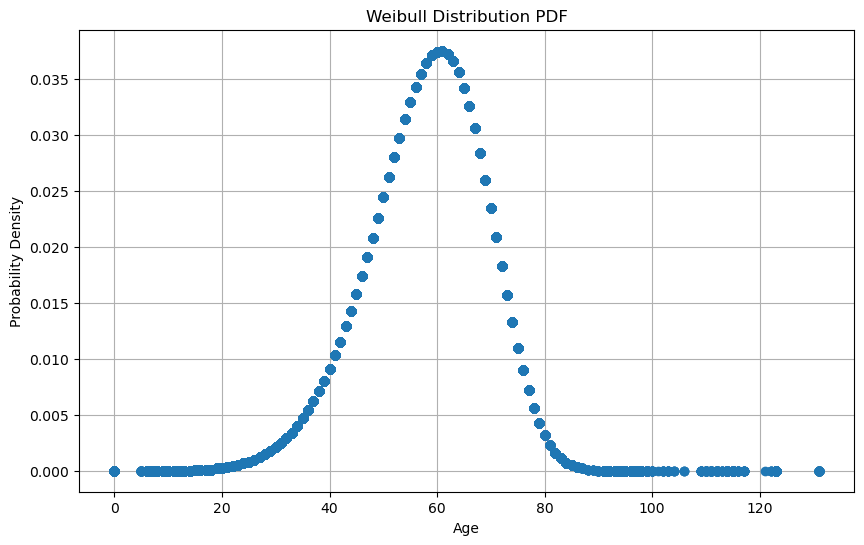

,OBJECTID,DAUID,INSTALLDAT,INSTALLYEAR,AGE,SVCI,SVI,EVI,ECI,Probability of failure (PDF)
66986,1611172,59153394.0,19750101,1975,48,100.00,47.31,99.97,75.14,2.08
66983,1611172,59153394.0,19750101,1975,48,100.00,47.31,99.97,75.14,2.08
66982,1611172,59153394.0,19750101,1975,48,100.00,47.31,99.97,75.14,2.08
69613,1611172,59153586.0,19750101,1975,48,99.85,47.51,99.44,75.14,2.08
69621,1611172,59153586.0,19750101,1975,48,99.85,47.51,99.44,75.14,2.08
...,...,...,...,...,...,...,...,...,...,...
74010,1667730,59154026.0,19470101,1947,76,0.00,NaN,0.00,0.01,0.90
73995,1605318,59154026.0,20060505,2006,17,0.00,NaN,0.00,0.01,0.01
74011,1667729,59154026.0,19470101,1947,76,0.00,NaN,0.00,0.00,0.90
74018,1616331,59154026.0,20101125,2010,13,0.00,NaN,0.00,0.00,0.00


In [8]:
shape_factor = 6.273
scale_factor = 62.364

# Calculate probability density function (PDF) of Weibull distribution
SVCI['Probability of failure (PDF)'] = weibull_min.pdf(SVCI['AGE'], c=shape_factor, scale=scale_factor) * 100
SVCI['Probability of failure (PDF)'] = SVCI['Probability of failure (PDF)'].round(2)

# Plot the Weibull PDF with PDF values expressed in percentage (divide by 100)
plt.figure(figsize=(10, 6))
plt.plot(SVCI['AGE'], SVCI['Probability of failure (PDF)'] / 100, marker='o', linestyle='none')  
plt.title('Weibull Distribution PDF')
plt.xlabel('Age')
plt.ylabel('Probability Density')
plt.grid(True)
plt.show()

selected_columns = ['OBJECTID', 'DAUID', 'INSTALLDAT', 'INSTALLYEAR', 'AGE', 'SVCI','SVI', 'EVI','ECI', 'Probability of failure (PDF)']
selected_df = SVCI[selected_columns]

selected_df

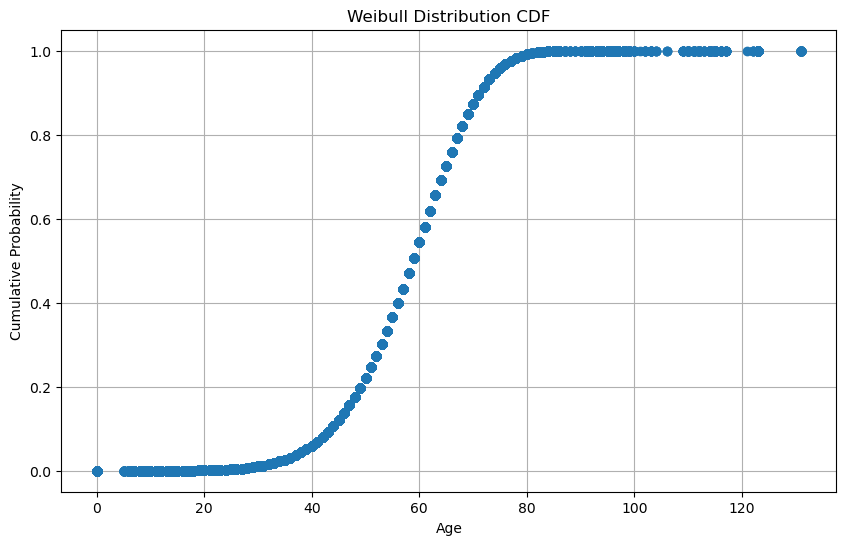

,OBJECTID,DAUID,INSTALLDAT,INSTALLYEAR,AGE,SVCI,SVI,EVI,ECI,Probability of failure (CDF)
66986,1611172,59153394.0,19750101,1975,48,100.00,47.31,99.97,75.14,17.60
66983,1611172,59153394.0,19750101,1975,48,100.00,47.31,99.97,75.14,17.60
66982,1611172,59153394.0,19750101,1975,48,100.00,47.31,99.97,75.14,17.60
69613,1611172,59153586.0,19750101,1975,48,99.85,47.51,99.44,75.14,17.60
69621,1611172,59153586.0,19750101,1975,48,99.85,47.51,99.44,75.14,17.60
...,...,...,...,...,...,...,...,...,...,...
74010,1667730,59154026.0,19470101,1947,76,0.00,NaN,0.00,0.01,96.85
73995,1605318,59154026.0,20060505,2006,17,0.00,NaN,0.00,0.01,0.03
74011,1667729,59154026.0,19470101,1947,76,0.00,NaN,0.00,0.00,96.85
74018,1616331,59154026.0,20101125,2010,13,0.00,NaN,0.00,0.00,0.01


In [9]:
shape_factor = 6.273
scale_factor = 62.364

# Calculate cumulative distribution function (CDF) of Weibull distribution
SVCI['Probability of failure (CDF)'] = weibull_min.cdf(SVCI['AGE'], c=shape_factor, scale=scale_factor) * 100
SVCI['Probability of failure (CDF)'] = SVCI['Probability of failure (CDF)'].round(2)

# Plot the Weibull CDF
plt.figure(figsize=(10, 6))
plt.plot(SVCI['AGE'], SVCI['Probability of failure (CDF)'] / 100, marker='o', linestyle='none')  
plt.title('Weibull Distribution CDF')
plt.xlabel('Age')
plt.ylabel('Cumulative Probability')
plt.grid(True)
plt.show()

selected_columns = ['OBJECTID', 'DAUID', 'INSTALLDAT', 'INSTALLYEAR', 'AGE', 'SVCI','SVI', 'EVI','ECI', 'Probability of failure (CDF)']
selected_df = SVCI[selected_columns]

selected_df

In [10]:
# Calculate 'Risk' column
SVCI['Risk'] = SVCI['Probability of failure (CDF)'] * SVCI['SVCI']

# Use MinMaxScaler to scale 'Risk' column to a range between 0 and 100
scaler = MinMaxScaler(feature_range=(0, 100))
SVCI['Risk'] = scaler.fit_transform(SVCI[['Risk']]).round(2)
SVCI.sort_values(by='Risk', ascending=False, inplace=True)

# Select only the desired columns
selected_columns = ['OBJECTID', 'DAUID', 'INSTALLDAT', 'INSTALLYEAR', 'AGE', 'length-spl','DIAMETER', 'Probability of failure (CDF)', 'SVCI','SVI', 'EVI','ECI', 'Risk']
selected_df = SVCI[selected_columns]

selected_df

,OBJECTID,DAUID,INSTALLDAT,INSTALLYEAR,AGE,length-spl,DIAMETER,Probability of failure (CDF),SVCI,SVI,EVI,ECI,Risk
69895,1613785,59153586.0,19390101,1939,84,54.48,1500.0,99.85,78.64,47.51,99.44,27.97,100.00
69717,1613285,59153586.0,19390101,1939,84,31.42,1500.0,99.85,73.32,47.51,99.44,16.13,93.23
69631,1613858,59153586.0,19130101,1913,110,120.00,650.0,100.00,71.81,47.51,99.44,12.77,91.45
69904,1613858,59153586.0,19130101,1913,110,3.06,650.0,100.00,71.81,47.51,99.44,12.77,91.45
69711,1613502,59153586.0,19390101,1939,84,21.03,1500.0,99.85,70.92,47.51,99.44,10.80,90.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...
54272,1600840,59153078.0,0,0,0,8.51,450.0,0.00,22.08,48.76,0.00,0.34,0.00
37996,1662403,59150905.0,20110301,2011,12,4.23,200.0,0.00,22.08,49.02,0.00,0.08,0.00
52983,1660300,59151479.0,20130806,2013,10,0.46,200.0,0.00,22.08,49.09,0.00,0.01,0.00
74862,1617060,59154143.0,20080731,2008,15,22.10,300.0,0.01,29.78,65.49,0.00,0.74,0.00


In [11]:
selected_df.to_csv('Risk_framework-120M.csv')